In [152]:
import scanpy as sc

# Visium 데이터 디렉토리 경로
data_dir = "/home/Data_Drive_8TB_3/kykim/colon/Totalvisium/SN048_A121573_Rep2"
adata = sc.read_visium(data_dir)
print(adata.obs.shape)

/home/user/anaconda3/envs/kykim/lib/python3.12/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/user/anaconda3/envs/kykim/lib/python3.12/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


(2385, 3)


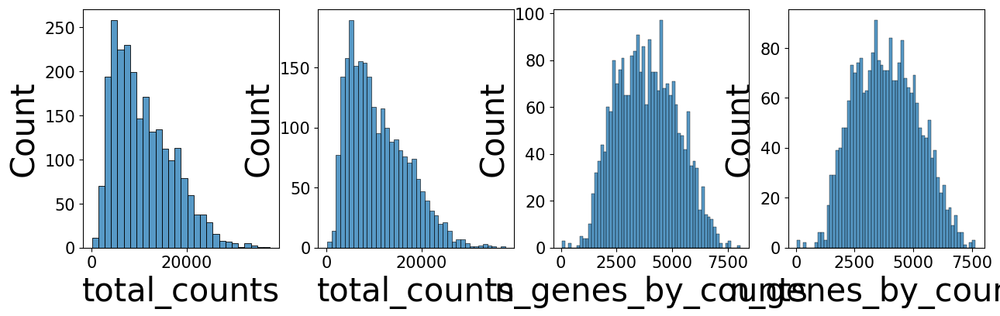

In [153]:
import matplotlib.pyplot as plt
import seaborn as sns
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.histplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.histplot(
    adata.obs["total_counts"][adata.obs["total_counts"] < 40000],
    kde=False,
    bins=40,
    ax=axs[1],
)
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.histplot(
    adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 8000],
    kde=False,
    bins=60,
    ax=axs[3],
)
plt.show()          # 그래프 출력

In [154]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

In [155]:
import pandas as pd
from scipy.sparse import issparse

# Dense matrix로 변환
dense_matrix = adata.X.toarray() if issparse(adata.X) else adata.X

# DataFrame으로 변환
gene_expression_df = pd.DataFrame(
    dense_matrix, 
    index=adata.obs_names, 
    columns=adata.var_names
)

# 데이터 확인
print(gene_expression_df.head())  # 상위 5개 행 출력


                    MIR1302-2HG  FAM138A  OR4F5  AL627309.1  AL627309.3  \
AAACAGCTTTCAGAAG-1          0.0      0.0    0.0         0.0         0.0   
AAACAGGGTCTATATT-1          0.0      0.0    0.0         0.0         0.0   
AAACCGGGTAGGTACC-1          0.0      0.0    0.0         0.0         0.0   
AAACCGTTCGTCCAGG-1          0.0      0.0    0.0         0.0         0.0   
AAACCTCATGAAGTTG-1          0.0      0.0    0.0         0.0         0.0   

                    AL627309.2  AL627309.5  AL627309.4  AP006222.2  \
AAACAGCTTTCAGAAG-1         0.0         0.0         0.0         0.0   
AAACAGGGTCTATATT-1         0.0         0.0         0.0         0.0   
AAACCGGGTAGGTACC-1         0.0         0.0         0.0         0.0   
AAACCGTTCGTCCAGG-1         0.0         0.0         0.0         0.0   
AAACCTCATGAAGTTG-1         0.0         0.0         0.0         0.0   

                    AL732372.1  ...  AC133551.1  AC136612.1  AC136616.1  \
AAACAGCTTTCAGAAG-1         0.0  ...         0.0      

In [156]:
import pandas as pd

# 1. adata.obsm['spatial']을 DataFrame으로 변환
spatial_df = pd.DataFrame(
    adata.obsm['spatial'], 
    columns=['x', 'y'],  # 열 이름 설정
    index=adata.obs.index  # obs와 동일한 인덱스 사용
)

# 2. x와 y 좌표를 adata.obs에 추가
adata.obs['x'] = spatial_df['x']
adata.obs['y'] = spatial_df['y']

# 3. 결과 확인
print(adata.obs[['x', 'y']].head())


                      x     y
AAACAGCTTTCAGAAG-1  382  1177
AAACAGGGTCTATATT-1  434  1268
AAACCGGGTAGGTACC-1  632  1154
AAACCGTTCGTCCAGG-1  816  1383
AAACCTCATGAAGTTG-1  513  1040


In [157]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler

# 1. 유전자 리스트 정의
genes = ['CTLA4', 'CEBPB', 'LCN2']

# 2. 각 유전자의 발현 데이터를 adata.obs에 추가
for gene in genes:
    if gene in adata.var_names:
        adata.obs[gene] = adata[:, gene].X.toarray().flatten()
    else:
        print(f"Gene {gene} not found in the dataset!")

# 3. 유전자 값의 합과 뺄셈 계산
# 합
adata.obs['CTLA4_CEBPB_sum'] = adata.obs['CTLA4'] + adata.obs['CEBPB']
adata.obs['CTLA4_LCN2_sum'] = adata.obs['CTLA4'] + adata.obs['LCN2']
adata.obs['CEBPB_LCN2_sum'] = adata.obs['CEBPB'] + adata.obs['LCN2']

# 뺄셈
adata.obs['CTLA4_CEBPB_diff'] = (adata.obs['CEBPB'] - adata.obs['CTLA4'])
adata.obs['CTLA4_LCN2_diff'] = (adata.obs['LCN2'] - adata.obs['CTLA4'])
adata.obs['CEBPB_LCN2_diff'] = (adata.obs['CEBPB'] - adata.obs['LCN2'])

# 4. Min-Max Scaling 대상 열 선택
columns_to_scale = [
    'CTLA4_CEBPB_sum', 'CTLA4_LCN2_sum', 'CEBPB_LCN2_sum',
    'CTLA4_CEBPB_diff', 'CTLA4_LCN2_diff', 'CEBPB_LCN2_diff'
]

# 5. 각각의 열에 대해 Min-Max Scaling 수행
scaler = MinMaxScaler()
for col in columns_to_scale:
    adata.obs[col] = scaler.fit_transform(adata.obs[[col]])

# 6. 결과 확인
print(adata.obs.head())


                    in_tissue  array_row  array_col  n_genes_by_counts  \
AAACAGCTTTCAGAAG-1          1         43          9               4974   
AAACAGGGTCTATATT-1          1         47         13               4673   
AAACCGGGTAGGTACC-1          1         42         28               3238   
AAACCGTTCGTCCAGG-1          1         52         42               4631   
AAACCTCATGAAGTTG-1          1         37         19               2099   

                    log1p_n_genes_by_counts  total_counts  log1p_total_counts  \
AAACAGCTTTCAGAAG-1                 8.512181       14742.0            9.598524   
AAACAGGGTCTATATT-1                 8.449771       18334.0            9.816567   
AAACCGGGTAGGTACC-1                 8.083020        7786.0            8.960211   
AAACCGTTCGTCCAGG-1                 8.440744       13261.0            9.492658   
AAACCTCATGAAGTTG-1                 7.649693        3873.0            8.262043   

                    pct_counts_in_top_50_genes  pct_counts_in_top_10

In [158]:
adata.obs

,in_tissue,array_row,array_col,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,...,y,CTLA4,CEBPB,LCN2,CTLA4_CEBPB_sum,CTLA4_LCN2_sum,CEBPB_LCN2_sum,CTLA4_CEBPB_diff,CTLA4_LCN2_diff,CEBPB_LCN2_diff
AAACAGCTTTCAGAAG-1,1,43,9,4974,8.512181,14742.0,9.598524,21.543888,30.335097,39.763940,...,1177,0.000000,0.495735,3.708330,0.155587,0.688928,0.670061,0.497694,0.736624,0.306967
AAACAGGGTCTATATT-1,1,47,13,4673,8.449771,18334.0,9.816567,30.997055,41.622123,51.270863,...,1268,0.000000,0.709002,4.675555,0.222521,0.868617,0.858213,0.545731,0.928754,0.179916
AAACCGGGTAGGTACC-1,1,42,28,3238,8.083020,7786.0,8.960211,23.208323,32.751092,43.090162,...,1154,0.000000,0.795253,4.234687,0.249591,0.786713,0.801692,0.565159,0.841179,0.268742
AAACCGTTCGTCCAGG-1,1,52,42,4631,8.440744,13261.0,9.492658,20.119146,28.519719,38.353065,...,1383,0.000000,1.518824,3.795839,0.476685,0.705185,0.847073,0.728138,0.754007,0.464623
AAACCTCATGAAGTTG-1,1,37,19,2099,7.649693,3873.0,8.262043,21.223857,30.673896,40.717790,...,1040,0.000000,0.000000,3.411498,0.000000,0.633783,0.543738,0.386033,0.677661,0.273449
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTCAGTGTGCTAC-1,1,24,64,4205,8.344267,10449.0,9.254357,23.236673,30.117715,38.242894,...,742,0.000000,1.312661,2.307920,0.411980,0.428762,0.577063,0.681702,0.458446,0.680615
TTGTTCTAGATACGCT-1,1,21,3,5660,8.641356,21993.0,9.998525,24.898831,34.656482,44.191334,...,673,0.000000,1.000833,2.347846,0.314113,0.436179,0.533726,0.611464,0.466377,0.621340
TTGTTGTGTGTCAAGA-1,1,31,77,3406,8.133587,7904.0,8.975251,21.305668,29.478745,39.271255,...,903,0.000000,0.787030,2.650809,0.247010,0.492463,0.547937,0.563307,0.526557,0.534259
TTGTTTCACATCCAGG-1,1,58,42,4851,8.487146,15841.0,9.670420,23.281359,33.653178,43.469478,...,1521,0.000000,0.785895,3.409894,0.246654,0.633485,0.668742,0.563051,0.677342,0.406152


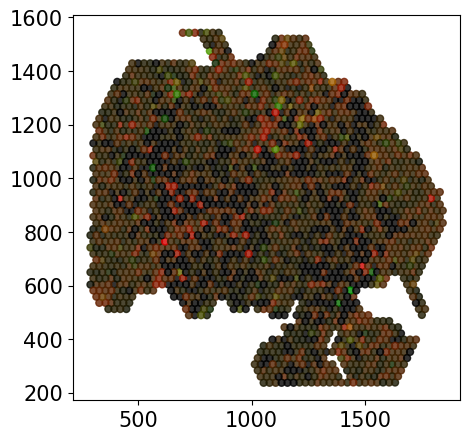

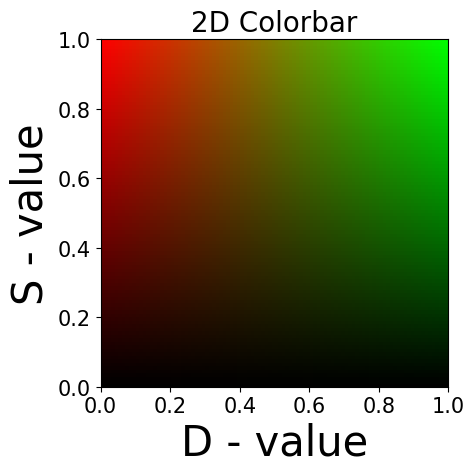

In [159]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import Normalize

# 1. 정규화
norm_sum = Normalize(vmin=adata.obs['CTLA4_CEBPB_sum'].min(), vmax=adata.obs['CTLA4_CEBPB_sum'].max())
norm_diff = Normalize(vmin=adata.obs['CTLA4_CEBPB_diff'].min(), vmax=adata.obs['CTLA4_CEBPB_diff'].max())

# 2. 색상 값 계산
colors = np.zeros((adata.obs.shape[0], 3))  # R, G, B
diff_normalized = norm_diff(adata.obs['CTLA4_CEBPB_diff'])

# RGB 전환: Green -> Red 부드러운 전환
colors[:, 0] = diff_normalized  # Red increases with diff
colors[:, 1] = 1 - diff_normalized  # Green decreases with diff
colors[:, 2] = 0  # Blue channel remains unused
colors *= norm_sum(adata.obs['CTLA4_CEBPB_sum'])[:, None]  # Scale brightness based on 'sum'

# 3. 좌표 플롯
fig, ax = plt.subplots(figsize=(5, 5))
scatter = ax.scatter(
    adata.obs['x'], adata.obs['y'], 
    c=colors, 
    s=25, alpha=0.8
)

# 4. 2D 컬러바 생성
fig, cbar_ax = plt.subplots(figsize=(5, 5))

# 컬러 맵을 2D로 정의
x = np.linspace(adata.obs['CTLA4_CEBPB_diff'].min(), adata.obs['CTLA4_CEBPB_diff'].max(), 100)
y = np.linspace(adata.obs['CTLA4_CEBPB_sum'].min(), adata.obs['CTLA4_CEBPB_sum'].max(), 100)
X, Y = np.meshgrid(x, y)

# RGB 값을 계산 (부드러운 전환)
X_norm = norm_diff(X)
G = X_norm  # Red increases with diff
R = 1 - X_norm  # Green decreases with diff
B = np.zeros_like(R)  # Blue remains 0
cbar_colors = np.stack([R, G, B], axis=-1) * norm_sum(Y)[:, :, None]  # Scale brightness by 'sum'

# 2D 컬러 맵 플롯
cbar_ax.imshow(cbar_colors, extent=[x.min(), x.max(), y.min(), y.max()], origin='lower', aspect='auto')
cbar_ax.set_title('2D Colorbar')
cbar_ax.set_xlabel('D - value')
cbar_ax.set_ylabel('S - value')

plt.tight_layout()
plt.show()


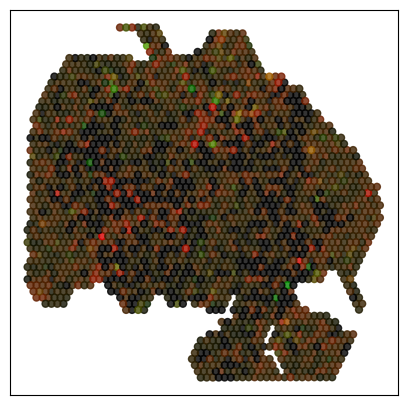

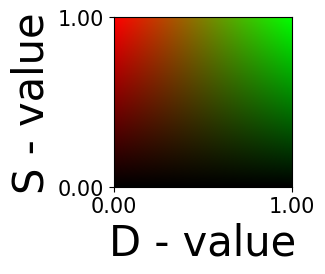

In [160]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import Normalize

# 1. 정규화
norm_sum = Normalize(vmin=adata.obs['CTLA4_CEBPB_sum'].min(), vmax=adata.obs['CTLA4_CEBPB_sum'].max())
norm_diff = Normalize(vmin=adata.obs['CTLA4_CEBPB_diff'].min(), vmax=adata.obs['CTLA4_CEBPB_diff'].max())

# 2. 색상 값 계산
colors = np.zeros((adata.obs.shape[0], 3))  # R, G, B
diff_normalized = norm_diff(adata.obs['CTLA4_CEBPB_diff'])

# RGB 전환: Green -> Red 부드러운 전환
colors[:, 0] = diff_normalized  # Red increases with diff
colors[:, 1] = 1 - diff_normalized  # Green decreases with diff
colors[:, 2] = 0  # Blue channel remains unused
colors *= norm_sum(adata.obs['CTLA4_CEBPB_sum'])[:, None]  # Scale brightness based on 'sum'

# 3. 좌표 플롯
fig, ax = plt.subplots(figsize=(5, 5))
scatter = ax.scatter(
    adata.obs['x'], adata.obs['y'], 
    c=colors, 
    s=25, alpha=0.8
)

# x, y 축 눈금 숨기기
ax.set_xticks([])  # x축 눈금 숨기기
ax.set_yticks([])  # y축 눈금 숨기기
plt.show()

fig, cbar_ax = plt.subplots(figsize=(3.5, 3))  
plt.rcParams.update({
    "font.size": 15,       # 기본 폰트 크기
    "axes.titlesize": 20,  # 그래프 제목 폰트 크기
    "axes.labelsize": 30,  # 축 라벨 폰트 크기
    "xtick.labelsize": 15,  # x축 눈금 폰트 크기
    "ytick.labelsize": 15,  # y축 눈금 폰트 크기
    "legend.fontsize": 15, # 범례 폰트 크기
})
# 데이터 플로팅
cbar_ax.imshow(cbar_colors, extent=[x.min(), x.max(), y.min(), y.max()], origin='lower', aspect='auto')
cbar_ax.set_xlabel('D - value')
cbar_ax.set_ylabel('S - value')

# 최소 및 최대 눈금만 설정
cbar_ax.set_xticks([x.min(), x.max()])
cbar_ax.set_yticks([y.min(), y.max()])

# 축 눈금 레이블 추가
cbar_ax.set_xticklabels([f"{x.min():.2f}", f"{x.max():.2f}"])
cbar_ax.set_yticklabels([f"{y.min():.2f}", f"{y.max():.2f}"])

# 폰트 크기 설정


plt.tight_layout()
plt.show()

In [161]:
#여기#

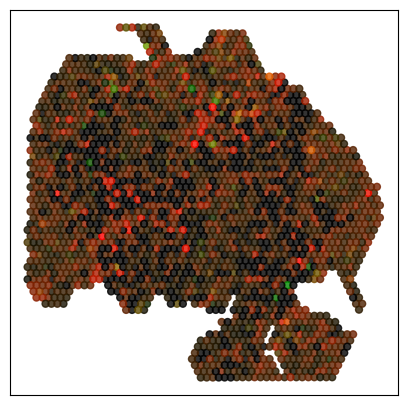

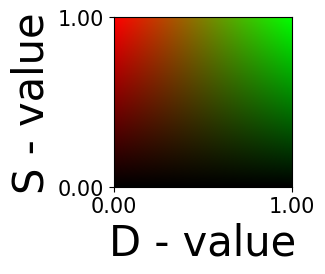

In [162]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import Normalize

# 1. 정규화
norm_sum = Normalize(vmin=adata.obs['CTLA4_CEBPB_sum'].min(), vmax=adata.obs['CTLA4_CEBPB_sum'].max())
norm_diff = Normalize(vmin=adata.obs['CTLA4_CEBPB_diff'].min(), vmax=adata.obs['CTLA4_CEBPB_diff'].max())

# 2. 색상 값 계산
colors = np.zeros((adata.obs.shape[0], 3))  # R, G, B
diff_normalized = norm_diff(adata.obs['CTLA4_CEBPB_diff'])

# RGB 전환: Green -> Red 부드러운 전환
colors[:, 0] = diff_normalized  # Red increases with diff
colors[:, 1] = 1 - diff_normalized  # Green decreases with diff
colors[:, 2] = 0  # Blue 채널은 사용 안함
colors *= norm_sum(adata.obs['CTLA4_CEBPB_sum'])[:, None]  # Scale brightness based on 'sum'

# 빨간색 강조 (밝기를 인위적으로 높임)
colors[:, 0] = np.clip(colors[:, 0] * 1.40, 0, 1)  # 빨간색 채널 값 1.5배로 강화하고, 1로 클리핑

# 3. 좌표 플롯
fig, ax = plt.subplots(figsize=(5, 5))
scatter = ax.scatter(
    adata.obs['x'], adata.obs['y'], 
    c=colors, 
    s=25, alpha=0.8
)

# x, y 축 눈금 숨기기
ax.set_xticks([])  # x축 눈금 숨기기
ax.set_yticks([])  # y축 눈금 숨기기
plt.show()

fig, cbar_ax = plt.subplots(figsize=(3.5, 3))  
plt.rcParams.update({
    "font.size": 15,       # 기본 폰트 크기
    "axes.titlesize": 20,  # 그래프 제목 폰트 크기
    "axes.labelsize": 30,  # 축 라벨 폰트 크기
    "xtick.labelsize": 15,  # x축 눈금 폰트 크기
    "ytick.labelsize": 15,  # y축 눈금 폰트 크기
    "legend.fontsize": 15, # 범례 폰트 크기
})
# 데이터 플로팅
cbar_ax.imshow(cbar_colors, extent=[x.min(), x.max(), y.min(), y.max()], origin='lower', aspect='auto')
cbar_ax.set_xlabel('D - value')
cbar_ax.set_ylabel('S - value')

# 최소 및 최대 눈금만 설정
cbar_ax.set_xticks([x.min(), x.max()])
cbar_ax.set_yticks([y.min(), y.max()])

# 축 눈금 레이블 추가
cbar_ax.set_xticklabels([f"{x.min():.2f}", f"{x.max():.2f}"])
cbar_ax.set_yticklabels([f"{y.min():.2f}", f"{y.max():.2f}"])

# 폰트 크기 설정


plt.tight_layout()
plt.show()

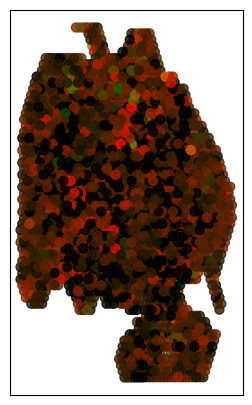

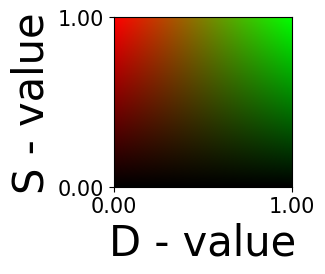

In [151]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import Normalize

# 1. 정규화
norm_sum = Normalize(vmin=adata.obs['CTLA4_CEBPB_sum'].min(), vmax=adata.obs['CTLA4_CEBPB_sum'].max())
norm_diff = Normalize(vmin=adata.obs['CTLA4_CEBPB_diff'].min(), vmax=adata.obs['CTLA4_CEBPB_diff'].max())

# 2. 색상 값 계산
colors = np.zeros((adata.obs.shape[0], 3))  # R, G, B
diff_normalized = norm_diff(adata.obs['CTLA4_CEBPB_diff'])

# RGB 전환: Green -> Red 부드러운 전환
colors[:, 0] = diff_normalized  # Red increases with diff
colors[:, 1] = 1 - diff_normalized  # Green decreases with diff
colors[:, 2] = 0  # Blue 채널은 사용 안함
colors *= norm_sum(adata.obs['CTLA4_CEBPB_sum'])[:, None]  # Scale brightness based on 'sum'

# 빨간색 강조 (밝기를 인위적으로 높임)
colors[:, 0] = np.clip(colors[:, 0] * 1.40, 0, 1)  # 빨간색 채널 값 1.5배로 강화하고, 1로 클리핑

# 3. 좌표 플롯
fig, ax = plt.subplots(figsize=(3, 5))
scatter = ax.scatter(
    adata.obs['x'], adata.obs['y'], 
    c=colors, 
    s=42.5, alpha=0.8
)

# x, y 축 눈금 숨기기
ax.set_xticks([])  # x축 눈금 숨기기
ax.set_yticks([])  # y축 눈금 숨기기
plt.show()

fig, cbar_ax = plt.subplots(figsize=(3.5, 3))  
plt.rcParams.update({
    "font.size": 15,       # 기본 폰트 크기
    "axes.titlesize": 20,  # 그래프 제목 폰트 크기
    "axes.labelsize": 30,  # 축 라벨 폰트 크기
    "xtick.labelsize": 15,  # x축 눈금 폰트 크기
    "ytick.labelsize": 15,  # y축 눈금 폰트 크기
    "legend.fontsize": 15, # 범례 폰트 크기
})
# 데이터 플로팅
cbar_ax.imshow(cbar_colors, extent=[x.min(), x.max(), y.min(), y.max()], origin='lower', aspect='auto')
cbar_ax.set_xlabel('D - value')
cbar_ax.set_ylabel('S - value')

# 최소 및 최대 눈금만 설정
cbar_ax.set_xticks([x.min(), x.max()])
cbar_ax.set_yticks([y.min(), y.max()])

# 축 눈금 레이블 추가
cbar_ax.set_xticklabels([f"{x.min():.2f}", f"{x.max():.2f}"])
cbar_ax.set_yticklabels([f"{y.min():.2f}", f"{y.max():.2f}"])

# 폰트 크기 설정


plt.tight_layout()
plt.show()

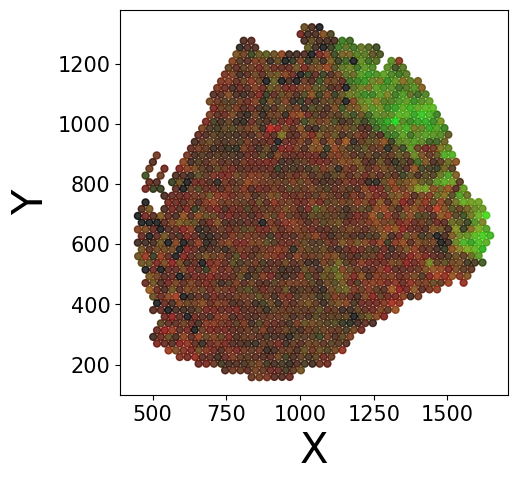

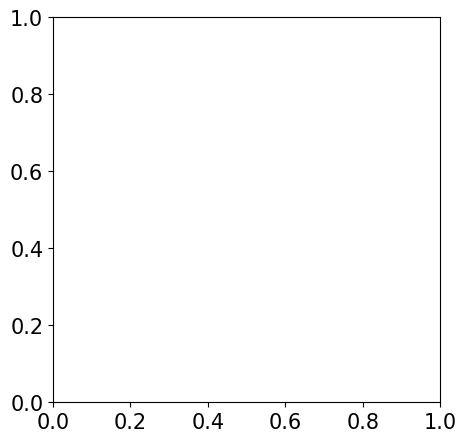

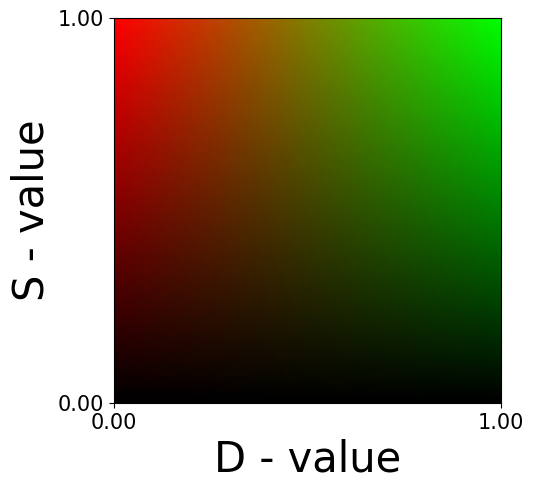

<Figure size 300x300 with 0 Axes>

In [56]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import Normalize

# 1. 정규화
norm_sum = Normalize(vmin=adata.obs['CEBPB_LCN2_sum'].min(), vmax=adata.obs['CEBPB_LCN2_sum'].max())
norm_diff = Normalize(vmin=adata.obs['CEBPB_LCN2_diff'].min(), vmax=adata.obs['CEBPB_LCN2_diff'].max())

# 2. 색상 값 계산
colors = np.zeros((adata.obs.shape[0], 3))  # R, G, B
diff_normalized = norm_diff(adata.obs['CEBPB_LCN2_diff'])

# RGB 전환: Green -> Red 부드러운 전환
colors[:, 0] = diff_normalized  # Red increases with diff
colors[:, 1] = 1 - diff_normalized  # Green decreases with diff
colors[:, 2] = 0  # Blue channel remains unused
colors *= norm_sum(adata.obs['CEBPB_LCN2_sum'])[:, None]  # Scale brightness based on 'sum'

# 3. 좌표 플롯
fig, ax = plt.subplots(figsize=(5, 5))
scatter = ax.scatter(
    adata.obs['x'], adata.obs['y'], 
    c=colors, 
    s=25, alpha=0.8
)
ax.set_xlabel('X')
ax.set_ylabel('Y')

# 4. 2D 컬러바 생성
fig, cbar_ax = plt.subplots(figsize=(5, 5))

# 컬러 맵을 2D로 정의
x = np.linspace(adata.obs['CEBPB_LCN2_diff'].min(), adata.obs['CEBPB_LCN2_diff'].max(), 100)
y = np.linspace(adata.obs['CEBPB_LCN2_sum'].min(), adata.obs['CEBPB_LCN2_sum'].max(), 100)
X, Y = np.meshgrid(x, y)

# RGB 값을 계산 (부드러운 전환)
X_norm = norm_diff(X)
G = X_norm  # Red increases with diff
R = 1 - X_norm  # Green decreases with diff
B = np.zeros_like(R)  # Blue remains 0
cbar_colors = np.stack([R, G, B], axis=-1) * norm_sum(Y)[:, :, None]  # Scale brightness by 'sum'

# 4. 2D 컬러바 생성
fig, cbar_ax = plt.subplots(figsize=(5, 5))

# 컬러 맵을 2D로 정의
x = np.linspace(adata.obs['CEBPB_LCN2_diff'].min(), adata.obs['CEBPB_LCN2_diff'].max(), 100)
y = np.linspace(adata.obs['CEBPB_LCN2_sum'].min(), adata.obs['CEBPB_LCN2_sum'].max(), 100)
X, Y = np.meshgrid(x, y)

# RGB 값을 계산 (부드러운 전환)
X_norm = norm_diff(X)
G = X_norm  # Red increases with diff
R = 1 - X_norm  # Green decreases with diff
B = np.zeros_like(R)  # Blue remains 0
cbar_colors = np.stack([R, G, B], axis=-1) * norm_sum(Y)[:, :, None]  # Scale brightness by 'sum'

plt.figure(figsize=(3, 3))  # 그래프 크기 설정
cbar_ax.imshow(cbar_colors, extent=[x.min(), x.max(), y.min(), y.max()], origin='lower', aspect='auto')
cbar_ax.set_xlabel('D - value')
cbar_ax.set_ylabel('S - value')

# 최소 및 최대 눈금만 설정
cbar_ax.set_xticks([x.min(), x.max()])
cbar_ax.set_yticks([y.min(), y.max()])

# 축 눈금 레이블 추가
cbar_ax.set_xticklabels([f"{x.min():.2f}", f"{x.max():.2f}"])
cbar_ax.set_yticklabels([f"{y.min():.2f}", f"{y.max():.2f}"])

plt.rcParams.update({
    "font.size": 30,       # 기본 폰트 크기
    "axes.titlesize": 25,  # 그래프 제목 폰트 크기
    "axes.labelsize": 20,  # 축 라벨 폰트 크기
    "xtick.labelsize": 15,  # x축 눈금 폰트 크기
    "ytick.labelsize": 15,  # y축 눈금 폰트 크기
    "legend.fontsize": 15, # 범례 폰트 크기
})

plt.tight_layout()
plt.show()


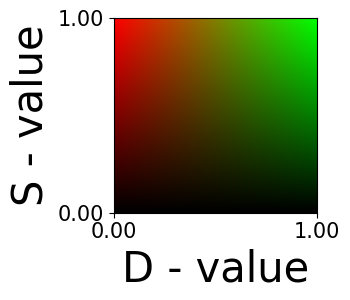

In [47]:
import matplotlib.pyplot as plt
plt.rcParams.update({
    "font.size": 40,       # 기본 폰트 크기
    "axes.titlesize": 25,  # 그래프 제목 폰트 크기
    "axes.labelsize": 30,  # 축 라벨 폰트 크기
    "xtick.labelsize": 15,  # x축 눈금 폰트 크기
    "ytick.labelsize": 15,  # y축 눈금 폰트 크기
    "legend.fontsize": 15, # 범례 폰트 크기
})
# 그래프 크기 설정
fig, cbar_ax = plt.subplots(figsize=(4.5, 4))  

# 데이터 플로팅
cbar_ax.imshow(cbar_colors, extent=[x.min(), x.max(), y.min(), y.max()], origin='lower', aspect='auto')
cbar_ax.set_xlabel('D - value')
cbar_ax.set_ylabel('S - value')

# 최소 및 최대 눈금만 설정
cbar_ax.set_xticks([x.min(), x.max()])
cbar_ax.set_yticks([y.min(), y.max()])

# 축 눈금 레이블 추가
cbar_ax.set_xticklabels([f"{x.min():.2f}", f"{x.max():.2f}"])
cbar_ax.set_yticklabels([f"{y.min():.2f}", f"{y.max():.2f}"])

# 폰트 크기 설정


plt.tight_layout()
plt.show()


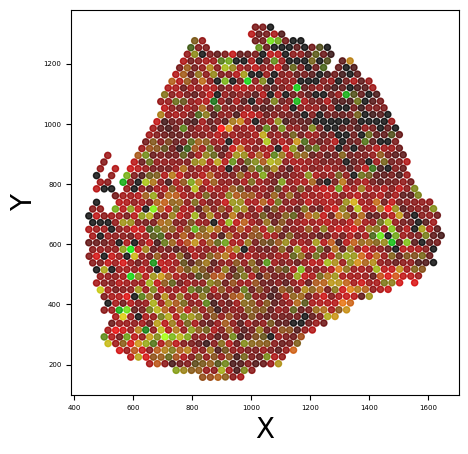

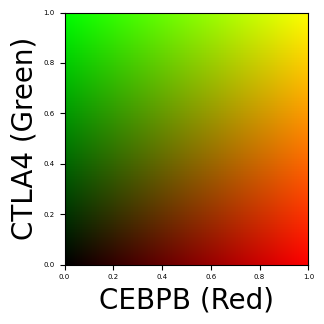

In [57]:
plt.rcParams.update({
    "font.size": 32,       # 기본 폰트 크기
    "axes.titlesize": 25,  # 그래프 제목 폰트 크기
    "axes.labelsize": 20,  # 축 라벨 폰트 크기
    "xtick.labelsize": 5,  # x축 눈금 폰트 크기
    "ytick.labelsize": 5,  # y축 눈금 폰트 크기
    "legend.fontsize": 15, # 범례 폰트 크기
})

import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import MinMaxScaler

# 1. MinMaxScaler로 스케일링
scaler = MinMaxScaler()

adata.obs['CEBPB_scaled'] = scaler.fit_transform(adata.obs[['CEBPB']])
adata.obs['CTLA4_scaled'] = scaler.fit_transform(adata.obs[['CTLA4']])

# 2. 색상 값 계산
colors = np.zeros((adata.obs.shape[0], 3))  # R, G, B
colors[:, 0] = adata.obs['CEBPB_scaled']  # Red for 'CEBPB' (scaled to [0, 1])
colors[:, 1] = adata.obs['CTLA4_scaled']  # Green for 'CTLA4' (scaled to [0, 1])
colors[:, 2] = 0  # Blue channel is not used

# 3. 좌표 플롯
fig, ax = plt.subplots(figsize=(5, 5))
scatter = ax.scatter(
    adata.obs['x'], adata.obs['y'], 
    c=colors, 
    s=20, alpha=0.8
)
# ax.set_title('Expression of CEBPB and CTLA4')
ax.set_xlabel('X')
ax.set_ylabel('Y')

# 4. 2D 컬러바 생성
fig, cbar_ax = plt.subplots(figsize=(4, 4))

# 컬러 맵을 2D로 정의
x = np.linspace(adata.obs['CEBPB_scaled'].min(), adata.obs['CEBPB_scaled'].max(), 100)
y = np.linspace(adata.obs['CTLA4_scaled'].min(), adata.obs['CTLA4_scaled'].max(), 100)
X, Y = np.meshgrid(x, y)

# RGB 값을 계산
R = X  # Red for 'CEBPB_scaled'
G = Y  # Green for 'CTLA4_scaled'
B = np.zeros_like(R)  # Blue is not used
cbar_colors = np.stack([R, G, B], axis=-1)

# 2D 컬러 맵 플롯
cbar_ax.imshow(cbar_colors, extent=[x.min(), x.max(), y.min(), y.max()], origin='lower', aspect='auto')
cbar_ax.set_xlabel('CEBPB (Red)')
cbar_ax.set_ylabel('CTLA4 (Green)')

plt.tight_layout()
plt.show()


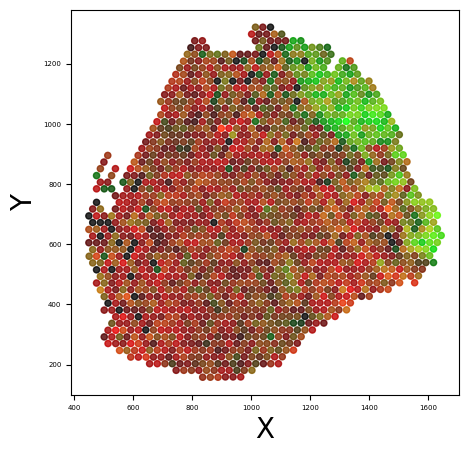

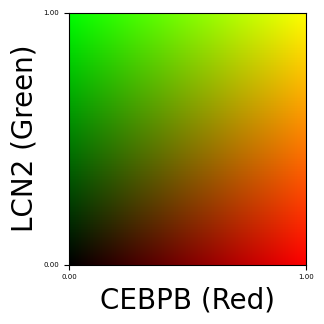

In [58]:
plt.rcParams.update({
    "font.size": 32,       # 기본 폰트 크기
    "axes.titlesize": 25,  # 그래프 제목 폰트 크기
    "axes.labelsize": 20,  # 축 라벨 폰트 크기
    "xtick.labelsize": 5,  # x축 눈금 폰트 크기
    "ytick.labelsize": 5,  # y축 눈금 폰트 크기
    "legend.fontsize": 15, # 범례 폰트 크기
})

import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import MinMaxScaler

# 1. MinMaxScaler로 스케일링
scaler = MinMaxScaler()

# MinMaxScaler 적용
adata.obs['LCN2_scaled'] = scaler.fit_transform(adata.obs[['LCN2']])
adata.obs['CEBPB_scaled'] = scaler.fit_transform(adata.obs[['CEBPB']])

# 2. 색상 값 계산
colors = np.zeros((adata.obs.shape[0], 3))  # R, G, B
colors[:, 0] = adata.obs['CEBPB_scaled']  # Red for 'CEBPB_scaled'
colors[:, 1] = adata.obs['LCN2_scaled']   # Green for 'LCN2_scaled'
colors[:, 2] = 0  # Blue channel is not used

# 3. 좌표 플롯
fig, ax = plt.subplots(figsize=(5, 5))
scatter = ax.scatter(
    adata.obs['x'], adata.obs['y'], 
    c=colors, 
    s=20, alpha=0.8
)
# ax.set_title('Expression of LCN2 and CEBPB')
ax.set_xlabel('X')
ax.set_ylabel('Y')

# 4. 2D 컬러바 생성
fig, cbar_ax = plt.subplots(figsize=(4, 4))

# 컬러 맵을 2D로 정의
x = np.linspace(adata.obs['CEBPB_scaled'].min(), adata.obs['CEBPB_scaled'].max(), 100)
y = np.linspace(adata.obs['LCN2_scaled'].min(), adata.obs['LCN2_scaled'].max(), 100)
X, Y = np.meshgrid(x, y)

# RGB 값을 계산
R = X  # Red for 'CEBPB_scaled'
G = Y  # Green for 'LCN2_scaled'
B = np.zeros_like(R)  # Blue is not used
cbar_colors = np.stack([R, G, B], axis=-1)

# 2D 컬러 맵 플롯
cbar_ax.imshow(cbar_colors, extent=[x.min(), x.max(), y.min(), y.max()], origin='lower', aspect='auto')
cbar_ax.set_xlabel('CEBPB (Red)')
cbar_ax.set_ylabel('LCN2 (Green)')

# 최소 및 최대 눈금만 설정
cbar_ax.set_xticks([x.min(), x.max()])
cbar_ax.set_yticks([y.min(), y.max()])

# 축 눈금 레이블 추가
cbar_ax.set_xticklabels([f"{x.min():.2f}", f"{x.max():.2f}"])
cbar_ax.set_yticklabels([f"{y.min():.2f}", f"{y.max():.2f}"])

plt.tight_layout()
plt.show()


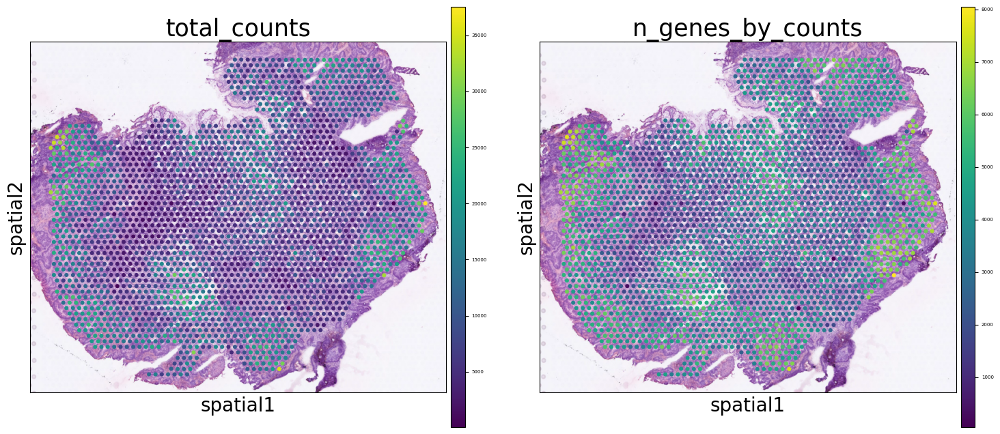

In [680]:
plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts"])

In [681]:
sc.pl.spatial(adata, img_key="hires", color=["CTLA4", "CEBPB","LCN2"])

ValueError: Key CTLA4 could be found in both .var_names and .obs.columns

<Figure size 2673x800 with 0 Axes>

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

for i, gene in enumerate(["CTLA4", "CEBPB", "LCN2"]):
    sc.pl.spatial(
        adata,
        img_key="hires",
        color=gene,
        size=1,
        ax=axes[i],  # 각 축에 플롯
        show=False
    )
    axes[i].set_title(f"{gene} Expression", fontsize=30)  # 타이틀 폰트 크기 설정

plt.show()


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def visualize_nearest_spots(adata, index, k=6):
    """
    특정 인덱스에서 가장 가까운 6개의 스팟(자기 자신 포함)을 시각화.
    자기 자신은 빨간색, 가장 가까운 스팟은 노란색, 나머지는 파란색으로 표시.
    
    Parameters:
        adata: AnnData 객체
        index: 관심 있는 인덱스
        k: 선택할 가장 가까운 좌표의 개수 (기본값: 6)
    """
    # array_row와 array_col 추출 (transpose 진행)
    array_row = adata.obs['y'].values
    array_col = adata.obs['x'].values

    # 선택된 인덱스의 좌표
    target_row = array_row[adata.obs.index == index][0]
    target_col = array_col[adata.obs.index == index][0]
    target_coords = np.array([target_row, target_col])
    
    # 모든 좌표를 2D 배열로 생성
    all_coords = np.stack((array_row, array_col), axis=1)
    
    # 거리 계산 (유클리드 거리)
    distances = np.linalg.norm(all_coords - target_coords, axis=1)
    
    # 가장 가까운 k개의 인덱스 찾기 (자기 자신 포함)
    nearest_indices = np.argsort(distances)[:k]

    # 자기 자신의 인덱스
    target_index = np.where(adata.obs.index == index)[0][0]

    # 시각화
    plt.figure(figsize=(8, 8))
    plt.scatter(array_col, array_row, s=10, c='blue', alpha=0.6, label='Other Spots')  # 나머지 스팟 (파란색)
    plt.scatter(array_col[nearest_indices], array_row[nearest_indices], s=50, c='yellow', label='Nearest Spots')  # 가까운 스팟 (노란색)
    plt.scatter(array_col[target_index], array_row[target_index], s=100, c='red', label='Target Spot')  # 선택된 스팟 (빨간색)
    plt.gca().invert_yaxis()  # Y축 반전 (Visium 좌표)
    plt.title(f'Visualization of {k} Nearest Spots (Including Target Spot) for {index}')
    plt.xlabel('Array Column')
    plt.ylabel('Array Row')
    plt.legend()
    plt.grid(False)
    plt.show()

# 함수 사용 예시
visualize_nearest_spots(adata, index='TTGTTCAGTGTGCTAC-1', k=7)


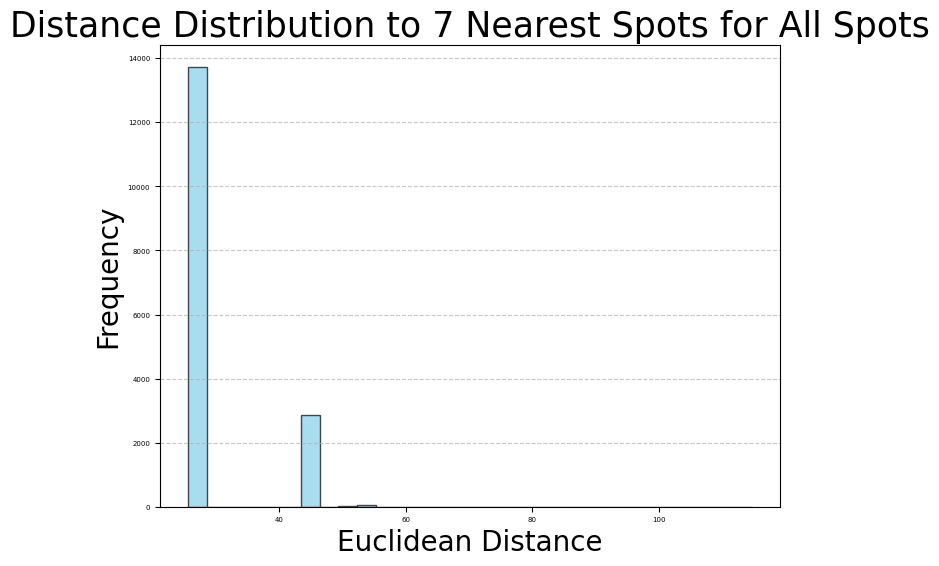

In [682]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_global_distances_histogram(adata, k=6):
    """
    모든 스팟에 대해 가장 가까운 k개의 스팟 간 거리 분포를 계산하고 히스토그램으로 시각화.
    
    Parameters:
        adata: AnnData 객체
        k: 각 스팟에서 가장 가까운 좌표의 개수 (기본값: 6)
    """
    # array_row와 array_col 추출
    array_row = adata.obs['y'].values
    array_col = adata.obs['x'].values
    
    # 모든 좌표를 2D 배열로 생성
    all_coords = np.stack((array_row, array_col), axis=1)
    
    # 모든 스팟에 대한 거리 분포 계산
    all_nearest_distances = []  # 모든 스팟의 거리 데이터 저장
    
    for i, target_coords in enumerate(all_coords):
        # 거리 계산 (유클리드 거리)
        distances = np.linalg.norm(all_coords - target_coords, axis=1)
        
        # 자기 자신 제외하고 가장 가까운 k개의 거리 추출
        nearest_distances = np.sort(distances)[1:k+1]  # [1:k+1] 자기 자신 제외
        all_nearest_distances.extend(nearest_distances)
    
    # 히스토그램 시각화
    plt.figure(figsize=(8, 6))
    plt.hist(all_nearest_distances, bins=30, color='skyblue', edgecolor='black', alpha=0.7)
    plt.title(f'Distance Distribution to {k} Nearest Spots for All Spots')
    plt.xlabel('Euclidean Distance')
    plt.ylabel('Frequency')
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

# 함수 사용 예시
visualize_global_distances_histogram(adata, k=7)


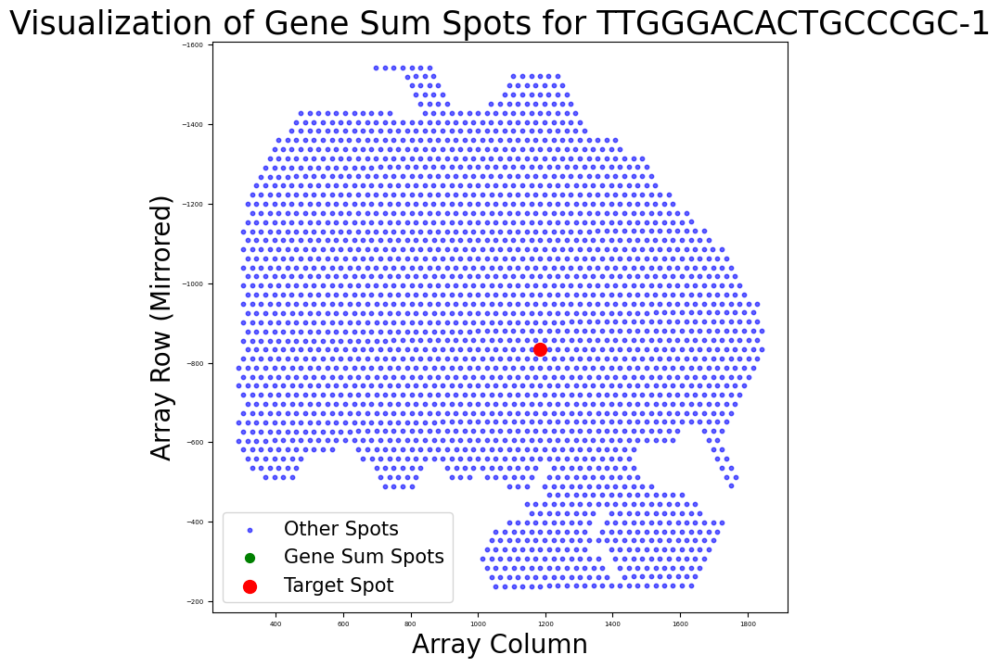

In [683]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_gene_sums(adata, index, genes, distance_threshold=85):
    """
    특정 스팟에서 유전자 합계 계산에 포함된 스팟을 시각화하여, 초록색으로 표시.
    
    Parameters:
        adata: AnnData 객체
        index: 관심 있는 스팟의 인덱스
        genes: 계산할 유전자 이름의 리스트 (adata.var_names와 일치해야 함)
        distance_threshold: 거리 임계값 (49 이상인 스팟은 제외)
    """
    # array_row와 array_col 추출
    array_row = adata.obs['y'].values
    array_col = adata.obs['x'].values

    # 모든 좌표를 2D 배열로 생성
    all_coords = np.stack((array_row, array_col), axis=1)

    # 현재 스팟의 좌표
    target_idx = adata.obs.index.get_loc(index)
    target_coords = all_coords[target_idx]

    # 거리 계산 (유클리드 거리)
    distances = np.linalg.norm(all_coords - target_coords, axis=1)

    # 거리 조건에 맞는 스팟 필터링 (49 이상 제외)
    valid_spots = distances < distance_threshold

    # 시각화
    plt.figure(figsize=(8, 8))
    plt.scatter(array_col, -array_row, s=10, c='blue', alpha=0.6, label='Other Spots')  # 나머지 스팟 (파란색)
    
    # 유전자 합계 계산된 스팟을 초록색으로 표시
    plt.scatter(array_col[valid_spots], -array_row[valid_spots], s=50, c='green', label='Gene Sum Spots')  # 초록색으로 표시

    plt.scatter(array_col[target_idx], -array_row[target_idx], s=100, c='red', label='Target Spot')  # 타겟 스팟 (빨간색)
    plt.gca().invert_yaxis()  # Y축 반전 (Visium 좌표)
    plt.title(f'Visualization of Gene Sum Spots for {index}')
    plt.xlabel('Array Column')
    plt.ylabel('Array Row (Mirrored)')
    plt.legend()
    plt.grid(False)
    plt.show()

# 예시: 'AAACCCGAACGAAATC-1' 인덱스를 기준으로 시각화
genes_to_calculate = ['CEBPB', 'CTLA4', 'LCN2', 'CXCL1']
visualize_gene_sums(adata, index='TTGGGACACTGCCCGC-1', genes=genes_to_calculate, distance_threshold=1)


In [684]:
def calculate_gene_sums_for_all(adata, genes, distance_threshold=85):
    """
    adata.obs.index의 모든 스팟에 대해 유전자 발현 합계를 계산하고 필터링된 스팟 개수를 저장.

    Parameters:
        adata: AnnData 객체
        genes: 계산할 유전자 이름의 리스트 (adata.var_names와 일치해야 함)
        distance_threshold: 거리 임계값 (49 이상인 스팟은 제외)
    """
    # array_row와 array_col 추출
    array_row = adata.obs['y'].values
    array_col = adata.obs['x'].values

    # 모든 좌표를 2D 배열로 생성
    all_coords = np.stack((array_row, array_col), axis=1)

    # 결과 저장을 위한 초기화
    for gene in genes:
        if gene in adata.var_names:
            if f'{gene}_sum' not in adata.obs:
                adata.obs[f'{gene}_sum'] = 0  # 기본값 0
        else:
            print(f"유전자 {gene}가 adata.var_names에 없습니다. 무시합니다.")

    # 필터링된 스팟 개수를 저장할 열 추가
    if 'filtered_spot_count' not in adata.obs:
        adata.obs['filtered_spot_count'] = 0

    # 모든 스팟에 대해 반복 수행
    for idx, index in enumerate(adata.obs.index):
        # 현재 스팟의 좌표
        target_coords = all_coords[idx]

        # 거리 계산 (유클리드 거리)
        distances = np.linalg.norm(all_coords - target_coords, axis=1)

        # 거리 조건에 맞는 스팟 필터링 (49 이상 제외)
        valid_spots = distances < distance_threshold

        # 필터링된 스팟 개수 저장
        a = valid_spots.sum()
        adata.obs.loc[index, 'filtered_spot_count'] = a

        # 유전자 발현 합계 계산
        for gene in genes:
            if gene in adata.var_names:
                # 해당 유전자의 발현값 추출 (밀집 배열로 변환)
                gene_expression = adata[:, gene].X.toarray().flatten()

                # 거리 조건에 맞는 스팟들의 발현값 합계 계산
                gene_sum = gene_expression[valid_spots].sum()

                # adata.obs에 추가
                adata.obs.loc[index, f'{gene}_sum'] = gene_sum

    print("모든 스팟에 대해 유전자 발현 합계 및 필터링된 스팟 개수를 계산했습니다.")


In [685]:
# genes_to_calculate = ['CEBPB', 'CTLA4', 'LCN2', 'CXCL1']

# calculate_gene_sums_for_all(adata, genes_to_calculate, distance_threshold=85)

In [686]:
def filter_low_spot_sums(adata, genes, k, distance_threshold=85):
    """
    adata.obs['filtered_spot_count']가 k/2 이하인 경우, 지정된 유전자 열을 'filtered'로 치환.

    Parameters:
        adata: AnnData 객체
        genes: 계산할 유전자 이름의 리스트
        k: 전체 스팟 개수
        distance_threshold: 거리 임계값 (기본값: 85)
    """
    # 유전자 발현 합계 및 필터링된 스팟 개수를 먼저 계산
    calculate_gene_sums_for_all(adata, genes, distance_threshold=distance_threshold)
    
    # k/2 기준 계산
    half_k = k / 2

    # 'filtered'로 치환할 열 이름 생성
    target_columns = [f'{gene}_sum' for gene in genes]

    # 조건에 따라 특정 열 치환
    for index in adata.obs.index:
        if adata.obs.loc[index, 'filtered_spot_count'] <= half_k:
            adata.obs.loc[index, target_columns] = 'filtered'

    print("filtered_spot_count가 k/2 이하인 행의 지정된 열을 'filtered'로 치환했습니다.")


# 함수 사용 예시
genes_to_calculate = ['CEBPB', 'CTLA4', 'LCN2', 'CXCL1']
# genes_to_calculate = ['CEBPB','CXCL1']
filter_low_spot_sums(adata, genes=genes_to_calculate, k=7, distance_threshold=30)


/tmp/ipykernel_4139828/2324289485.py:54: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '5.589232921600342' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  adata.obs.loc[index, f'{gene}_sum'] = gene_sum
/tmp/ipykernel_4139828/2324289485.py:54: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '27.24771499633789' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  adata.obs.loc[index, f'{gene}_sum'] = gene_sum
/tmp/ipykernel_4139828/2324289485.py:54: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '13.367609977722168' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  adata.obs.loc[index, f'{gene}_sum'] = gene_sum
/tmp/ipykernel_4139828/2

모든 스팟에 대해 유전자 발현 합계 및 필터링된 스팟 개수를 계산했습니다.
filtered_spot_count가 k/2 이하인 행의 지정된 열을 'filtered'로 치환했습니다.


/tmp/ipykernel_4139828/558698054.py:23: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'filtered' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  adata.obs.loc[index, target_columns] = 'filtered'
/tmp/ipykernel_4139828/558698054.py:23: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'filtered' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  adata.obs.loc[index, target_columns] = 'filtered'
/tmp/ipykernel_4139828/558698054.py:23: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value 'filtered' has dtype incompatible with float64, please explicitly cast to a compatible dtype first.
  adata.obs.loc[index, target_columns] = 'filtered'
/tmp/ipykernel_4139828/558698054.py:23: 

In [687]:
adata.obs['LCN2_sum'].value_counts()

LCN2_sum
filtered     7
20.6374      2
27.247715    1
23.048512    1
27.45723     1
            ..
29.628536    1
19.443054    1
24.826321    1
21.522224    1
27.7395      1
Name: count, Length: 2378, dtype: int64

In [688]:
adata.obs

,in_tissue,array_row,array_col,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,...,CTLA4_LCN2_diff,CEBPB_LCN2_diff,CEBPB_scaled,CTLA4_scaled,LCN2_scaled,CEBPB_sum,CTLA4_sum,LCN2_sum,CXCL1_sum,filtered_spot_count
AAACAGCTTTCAGAAG-1,1,43,9,4974,8.512181,14742.0,9.598524,21.543888,30.335097,39.763940,...,0.736624,0.306967,0.181868,0.000000,0.736624,5.589233,0.0,27.247715,13.36761,7
AAACAGGGTCTATATT-1,1,47,13,4673,8.449771,18334.0,9.816567,30.997055,41.622123,51.270863,...,0.928754,0.179916,0.260109,0.000000,0.928754,3.639409,0.340445,30.691509,13.55734,7
AAACCGGGTAGGTACC-1,1,42,28,3238,8.083020,7786.0,8.960211,23.208323,32.751092,43.090162,...,0.841179,0.268742,0.291751,0.000000,0.841179,3.323097,0.0,27.399385,9.665022,7
AAACCGTTCGTCCAGG-1,1,52,42,4631,8.440744,13261.0,9.492658,20.119146,28.519719,38.353065,...,0.754007,0.464623,0.557205,0.000000,0.754007,7.687833,0.0,26.312283,13.298809,7
AAACCTCATGAAGTTG-1,1,37,19,2099,7.649693,3873.0,8.262043,21.223857,30.673896,40.717790,...,0.677661,0.273449,0.000000,0.000000,0.677661,4.053113,0.0,24.778702,10.215301,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTCAGTGTGCTAC-1,1,24,64,4205,8.344267,10449.0,9.254357,23.236673,30.117715,38.242894,...,0.458446,0.680615,0.481571,0.000000,0.458446,5.41575,0.0,17.801657,4.102144,7
TTGTTCTAGATACGCT-1,1,21,3,5660,8.641356,21993.0,9.998525,24.898831,34.656482,44.191334,...,0.466377,0.621340,0.367172,0.000000,0.466377,4.519317,0.0,11.928601,4.331672,5
TTGTTGTGTGTCAAGA-1,1,31,77,3406,8.133587,7904.0,8.975251,21.305668,29.478745,39.271255,...,0.526557,0.534259,0.288735,0.000000,0.526557,6.499059,0.0,21.61466,8.630099,7
TTGTTTCACATCCAGG-1,1,58,42,4851,8.487146,15841.0,9.670420,23.281359,33.653178,43.469478,...,0.677342,0.406152,0.288318,0.000000,0.677342,5.805729,0.66714,22.826134,11.268365,7


/tmp/ipykernel_4139828/2200304576.py:17: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  filtered_data = adata.obs[['CEBPB_sum', 'CTLA4_sum']].replace('filtered', np.nan).dropna()


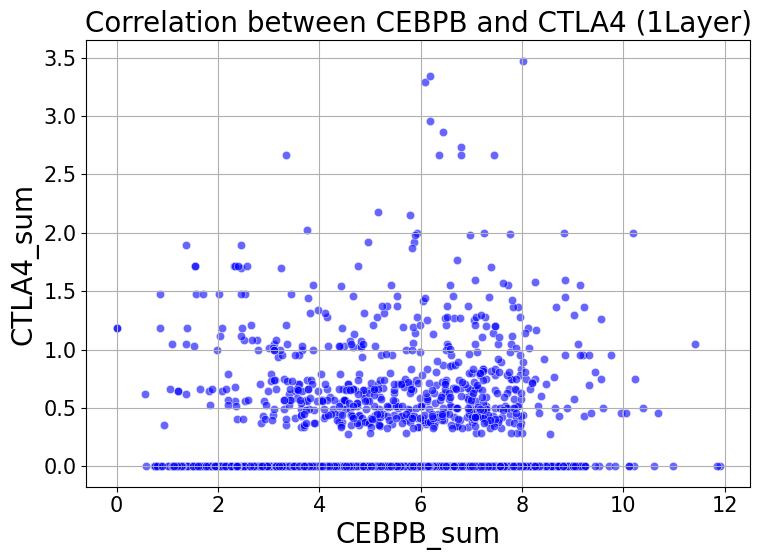

Correlation : 0.09702
p-value: 2.13663e-06


In [689]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
import numpy as np

# 폰트 크기 설정
plt.rcParams.update({
    "font.size": 20,       # 기본 폰트 크기
    "axes.titlesize": 20,  # 그래프 제목 폰트 크기
    "axes.labelsize": 20,  # 축 라벨 폰트 크기
    "xtick.labelsize": 15, # x축 눈금 폰트 크기
    "ytick.labelsize": 15, # y축 눈금 폰트 크기
    "legend.fontsize": 15, # 범례 폰트 크기
})

# 'filtered'로 지정된 데이터 제외
filtered_data = adata.obs[['CEBPB_sum', 'CTLA4_sum']].replace('filtered', np.nan).dropna()

# CEBPB_sum과 CTLA4_sum 간의 상관 계수 및 p-value 계산
correlation, p_value = pearsonr(filtered_data['CEBPB_sum'], filtered_data['CTLA4_sum'])

# 산점도 시각화
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x=filtered_data['CEBPB_sum'], 
    y=filtered_data['CTLA4_sum'], 
    color='b', 
    alpha=0.6
)

# 상관 계수와 p-value 텍스트 추가
plt.title(f'Correlation between CEBPB and CTLA4 (1Layer)')
plt.xlabel('CEBPB_sum')
plt.ylabel('CTLA4_sum')
plt.grid(True)
plt.tight_layout()
plt.show()

# 상관 계수와 p-value 출력
print(f"Correlation : {correlation:.5f}")
print(f"p-value: {p_value:.5e}")

/tmp/ipykernel_4139828/369010717.py:17: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  filtered_data = adata.obs[['CEBPB_sum', 'CTLA4_sum']].replace('filtered', np.nan).dropna()


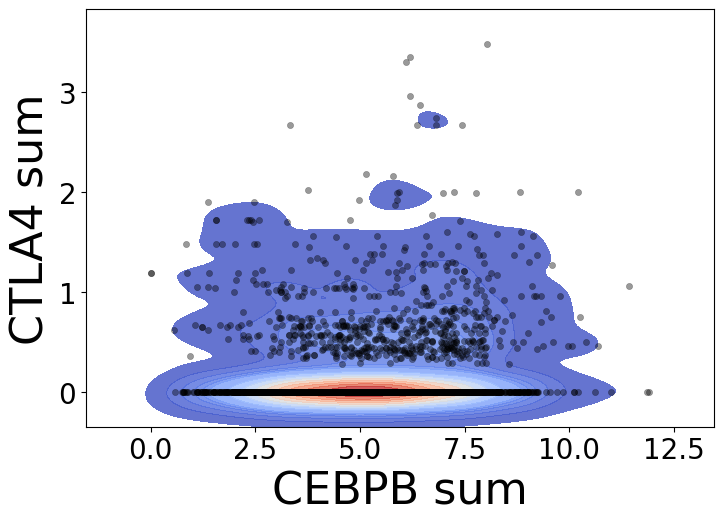

Correlation: 0.09702
p-value: 2.13663e-06


In [690]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
import numpy as np

# 폰트 크기 설정
plt.rcParams.update({
    "font.size": 32,  # 기본 폰트 크기
    "axes.titlesize": 32,  # 타이틀 폰트 크기
    "axes.labelsize": 32,  # 축 라벨 폰트 크기
    "xtick.labelsize": 20,  # x축 눈금 폰트 크기
    "ytick.labelsize": 20,  # y축 눈금 폰트 크기
    "legend.fontsize": 15,  # 범례 폰트 크기
})

# 'filtered'로 지정된 데이터 제외
filtered_data = adata.obs[['CEBPB_sum', 'CTLA4_sum']].replace('filtered', np.nan).dropna()

# CEBPB_sum과 CTLA4_sum 간의 상관 계수 및 p-value 계산
correlation, p_value = pearsonr(filtered_data['CEBPB_sum'], filtered_data['CTLA4_sum'])

# 산점도와 밀도 등고선 시각화
plt.figure(figsize=(8, 6))

# 밀도 등고선
sns.kdeplot(
    x=filtered_data['CEBPB_sum'], 
    y=filtered_data['CTLA4_sum'], 
    fill=True, 
    cmap="coolwarm",  # 더 뚜렷한 색상 팔레트 사용
    alpha=0.8,        # 밀도 투명도 조절
    levels=15,        # 더 많은 등고선 레벨 추가
    thresh=0.02       # 최소 밀도값 기준 낮춤
)

# 산점도
sns.scatterplot(
    x=filtered_data['CEBPB_sum'], 
    y=filtered_data['CTLA4_sum'], 
    color='black',    # 점 색상 설정
    alpha=0.4,        # 점의 투명도 증가
    edgecolor=None,   # 점 외곽선 제거
    s=20              # 점 크기 조절
)

# 상관 계수와 p-value 텍스트 추가
# plt.title(f'Correlation between CEBPB and CTLA4(1Layer)')
plt.xlabel('CEBPB sum')
plt.ylabel('CTLA4 sum')
plt.tight_layout()
plt.show()

# 상관 계수와 p-value 출력
print(f"Correlation: {correlation:.5f}")
print(f"p-value: {p_value:.5e}")

# 전체 스팟 개수
total_spots = adata.obs.shape[0]

# 'filtered'로 지정된 데이터 개수
filtered_count = (adata.obs[['CEBPB_sum', 'CTLA4_sum']] == 'filtered').any(axis=1).sum()


/tmp/ipykernel_4139828/2675664226.py:17: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  filtered_data = adata.obs[['CEBPB_sum', 'LCN2_sum']].replace('filtered', np.nan).dropna()


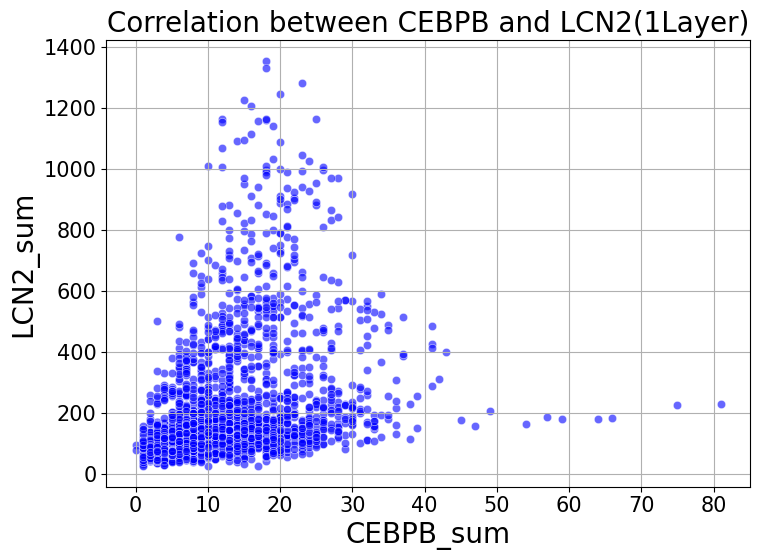

Correlation : 0.35314
p-value: 8.79974e-71


In [377]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
import numpy as np

# 폰트 크기 설정
plt.rcParams.update({
    "font.size": 20,  # 기본 폰트 크기
    "axes.titlesize": 20,  # 타이틀 폰트 크기
    "axes.labelsize": 20,  # 축 라벨 폰트 크기
    "xtick.labelsize": 15,  # x축 눈금 폰트 크기
    "ytick.labelsize": 15,  # y축 눈금 폰트 크기
    "legend.fontsize": 15,  # 범례 폰트 크기
})

# 'filtered'로 지정된 데이터 제외
filtered_data = adata.obs[['CEBPB_sum', 'LCN2_sum']].replace('filtered', np.nan).dropna()

# CEBPB_sum과 LCN2_sum 간의 상관 계수 및 p-value 계산
correlation, p_value = pearsonr(filtered_data['CEBPB_sum'], filtered_data['LCN2_sum'])

# 산점도 시각화
plt.figure(figsize=(8, 6))
sns.scatterplot(
    x=filtered_data['CEBPB_sum'], 
    y=filtered_data['LCN2_sum'], 
    color='b', 
    alpha=0.6
)

# 상관 계수와 p-value 텍스트 추가
plt.title(f'Correlation between CEBPB and LCN2(1Layer)')
plt.xlabel('CEBPB_sum')
plt.ylabel('LCN2_sum')
plt.grid(True)
plt.tight_layout()
plt.show()

# 상관 계수와 p-value 출력
print(f"Correlation : {correlation:.5f}")
print(f"p-value: {p_value:.5e}")

/tmp/ipykernel_4139828/1342486323.py:17: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  filtered_data = adata.obs[['CEBPB_sum', 'LCN2_sum']].replace('filtered', np.nan).dropna()


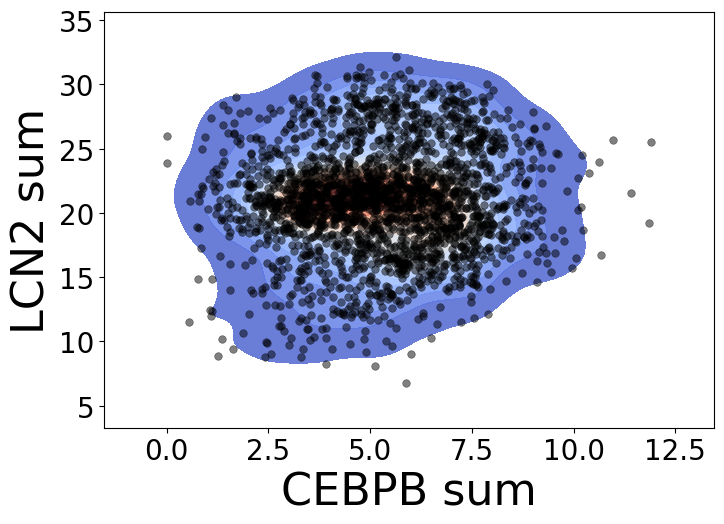

Correlation : 0.06667
p-value: 1.14199e-03


In [692]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
import numpy as np

# 전체 폰트 크기 설정
plt.rcParams.update({
    "font.size": 32,       # 기본 폰트 크기
    "axes.titlesize": 32,  # 그래프 제목 폰트 크기
    "axes.labelsize": 32,  # 축 라벨 폰트 크기
    "xtick.labelsize": 20, # x축 눈금 폰트 크기
    "ytick.labelsize": 20, # y축 눈금 폰트 크기
    "legend.fontsize": 15, # 범례 폰트 크기
})

# 'filtered'로 지정된 데이터 제외
filtered_data = adata.obs[['CEBPB_sum', 'LCN2_sum']].replace('filtered', np.nan).dropna()

# CEBPB_sum과 LCN2_sum 간의 상관 계수 및 p-value 계산
correlation, p_value = pearsonr(filtered_data['CEBPB_sum'], filtered_data['LCN2_sum'])

# 산점도와 밀도 등고선 시각화
plt.figure(figsize=(8, 6))

# 밀도 등고선
sns.kdeplot(
    x=filtered_data['CEBPB_sum'], 
    y=filtered_data['LCN2_sum'], 
    fill=True, 
    cmap="coolwarm",  # 더 뚜렷한 색상 팔레트 사용
    alpha=0.8,        # 밀도 투명도 조절
    levels=15,        # 더 많은 등고선 레벨 추가
    thresh=0.02       # 최소 밀도값 기준 낮춤
)

# 산점도
sns.scatterplot(
    x=filtered_data['CEBPB_sum'], 
    y=filtered_data['LCN2_sum'], 
    color='black',    # 점 색상 설정
    alpha=0.5,        # 점의 투명도 증가
    edgecolor=None,   # 점 외곽선 제거
    s=30              # 점 크기 조절
)

# 상관 계수와 p-value 텍스트 추가
# plt.title(f'Correlation between CEBPB and LCN2(1Layer)')
plt.xlabel('CEBPB sum')
plt.ylabel('LCN2 sum')
plt.tight_layout()
plt.show()

# 상관 계수와 p-value 출력
print(f"Correlation : {correlation:.5f}")
print(f"p-value: {p_value:.5e}")


Correlation between CEBPB and CTLA4: 0.12
P-value: 1.13e-08


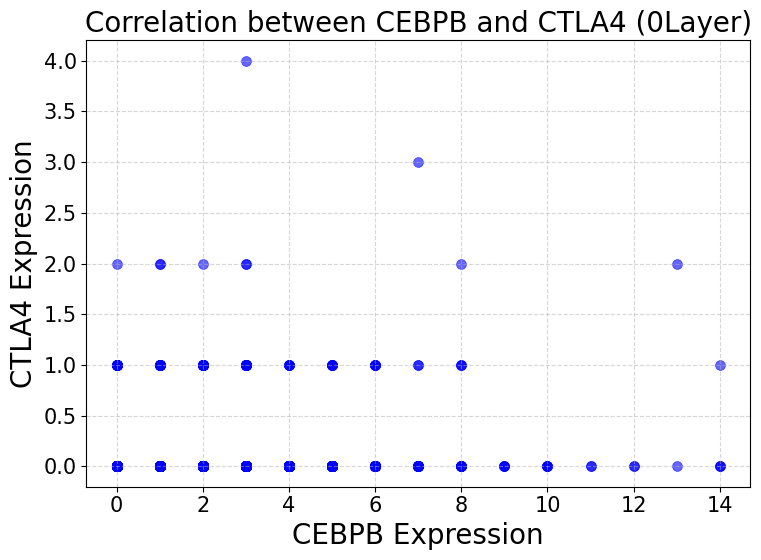

Correlation: 0.11657
P-value: 1.13446e-08


In [379]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy.stats import pearsonr

# 유전자 이름이 중복되지 않도록 설정
adata.var_names_make_unique()

# 관심 유전자
genes = ["CEBPB", "CTLA4"]

# 유전자 이름 존재 여부 확인
if all(gene in adata.var_names for gene in genes):
    # 유전자 발현 값 추출
    expression_data = adata[:, genes].X.toarray() if hasattr(adata[:, genes].X, "toarray") else adata[:, genes].X
    expression_df = pd.DataFrame(expression_data, columns=genes, index=adata.obs.index)

    # 상관계수 및 p-value 계산
    correlation, p_value = pearsonr(expression_df[genes[0]], expression_df[genes[1]])

    # 결과 출력
    print(f"Correlation between {genes[0]} and {genes[1]}: {correlation:.2f}")
    print(f"P-value: {p_value:.2e}")

    # 폰트 크기 설정
    plt.rcParams.update({
        "font.size": 20,       # 기본 폰트 크기
        "axes.titlesize": 20,  # 그래프 제목 폰트 크기
        "axes.labelsize": 20,  # 축 라벨 폰트 크기
        "xtick.labelsize": 15, # x축 눈금 폰트 크기
        "ytick.labelsize": 15, # y축 눈금 폰트 크기
        "legend.fontsize": 15, # 범례 폰트 크기
    })

    # 산점도 그리기
    plt.figure(figsize=(8, 6))
    sns.scatterplot(
        x=expression_df[genes[0]], 
        y=expression_df[genes[1]], 
        alpha=0.6, 
        color="blue", 
        edgecolor=None, 
        s=50  # 점 크기
    )
    plt.xlabel(f"{genes[0]} Expression")
    plt.ylabel(f"{genes[1]} Expression")
    plt.title(f"Correlation between CEBPB and CTLA4 (0Layer)")
    plt.grid(True, linestyle='--', alpha=0.5)  # 점선 스타일 그리드 추가
    plt.tight_layout()
    plt.show()

    # 상관계수와 p-value 다시 출력
    print(f"Correlation: {correlation:.5f}")
    print(f"P-value: {p_value:.5e}")

else:
    print("One or both genes are not found in var_names.")


Correlation between CEBPB and CTLA4: 0.03
P-value: 9.91e-02


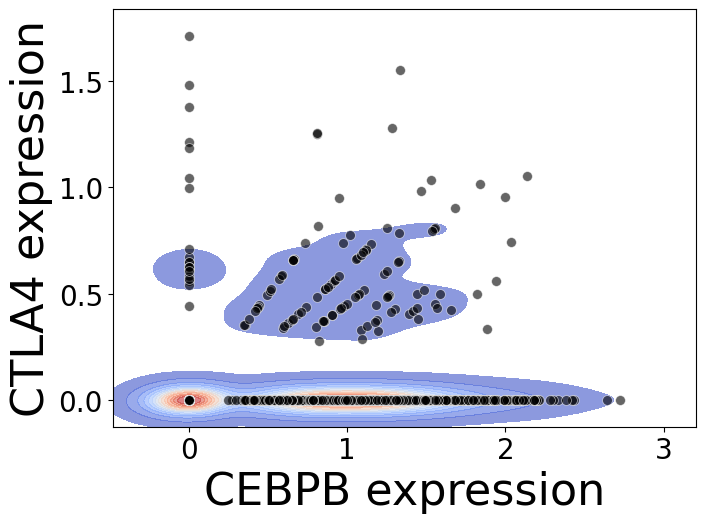

Correlation: 0.03377
P-value: 9.91391e-02


In [695]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy.stats import pearsonr

# 유전자 이름이 중복되지 않도록 설정
adata.var_names_make_unique()

# 관심 유전자
genes = ["CEBPB", "CTLA4"]

# 유전자 이름 존재 여부 확인
if all(gene in adata.var_names for gene in genes):
    # 유전자 발현 값 추출
    expression_data = adata[:, genes].X.toarray() if hasattr(adata[:, genes].X, "toarray") else adata[:, genes].X
    expression_df = pd.DataFrame(expression_data, columns=genes, index=adata.obs.index)

    # 상관계수 및 p-value 계산
    correlation, p_value = pearsonr(expression_df[genes[0]], expression_df[genes[1]])

    # 결과 출력
    print(f"Correlation between {genes[0]} and {genes[1]}: {correlation:.2f}")
    print(f"P-value: {p_value:.2e}")

    # 폰트 크기 설정
    plt.rcParams.update({
        "font.size": 32,       # 기본 폰트 크기
        "axes.titlesize": 32,  # 그래프 제목 폰트 크기
        "axes.labelsize": 32,  # 축 라벨 폰트 크기
        "xtick.labelsize": 20, # x축 눈금 폰트 크기
        "ytick.labelsize": 20, # y축 눈금 폰트 크기
        "legend.fontsize": 15, # 범례 폰트 크기
    })

    # 산점도 및 등고선 그리기
    plt.figure(figsize=(8, 6))
    
    # 밀도 등고선 추가
    sns.kdeplot(
        x=expression_df[genes[0]], 
        y=expression_df[genes[1]], 
        fill=True, 
        cmap="coolwarm", 
        alpha=0.6, 
        levels=15, 
        thresh=0.02
    )
    
    # 산점도 추가
    sns.scatterplot(
        x=expression_df[genes[0]], 
        y=expression_df[genes[1]], 
        alpha=0.6, 
        color="black", 
        s=50
    )
    
    # 그래프 설정
    plt.xlabel(f"{genes[0]} expression")
    plt.ylabel(f"{genes[1]} expression")
    plt.tight_layout()
    plt.show()

    # 결과 요약 출력
    print(f"Correlation: {correlation:.5f}")
    print(f"P-value: {p_value:.5e}")

else:
    print("One or both genes are not found in var_names.")


Correlation between CEBPB and LCN2: 0.25
P-value: 2.26e-34


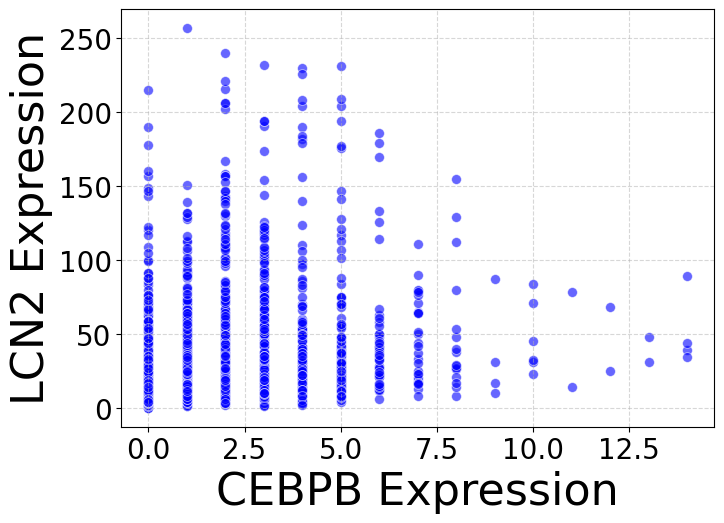

Correlation: 0.24659
P-value: 2.26409e-34


In [381]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy.stats import pearsonr

# 유전자 이름이 중복되지 않도록 설정
adata.var_names_make_unique()

# 관심 유전자
genes = ["CEBPB", "LCN2"]

# 유전자 이름 존재 여부 확인
if all(gene in adata.var_names for gene in genes):
    # 유전자 발현 값 추출
    expression_data = adata[:, genes].X.toarray() if hasattr(adata[:, genes].X, "toarray") else adata[:, genes].X
    expression_df = pd.DataFrame(expression_data, columns=genes, index=adata.obs.index)

    # 상관계수 및 p-value 계산
    correlation, p_value = pearsonr(expression_df[genes[0]], expression_df[genes[1]])

    # 결과 출력
    print(f"Correlation between {genes[0]} and {genes[1]}: {correlation:.2f}")
    print(f"P-value: {p_value:.2e}")

    # 폰트 크기 설정
    plt.rcParams.update({
        "font.size": 32,       # 기본 폰트 크기
        "axes.titlesize": 32,  # 그래프 제목 폰트 크기
        "axes.labelsize": 32,  # 축 라벨 폰트 크기
        "xtick.labelsize": 20, # x축 눈금 폰트 크기
        "ytick.labelsize": 20, # y축 눈금 폰트 크기
        "legend.fontsize": 15, # 범례 폰트 크기
    })

    # 산점도 그리기
    plt.figure(figsize=(8, 6))
    sns.scatterplot(x=expression_df[genes[0]], y=expression_df[genes[1]], alpha=0.6, color="Blue", s=50)

    # 그리드 추가
    plt.grid(True, linestyle='--', alpha=0.5)  # 점선 스타일 그리드 추가
    
    # 그래프 제목 및 축 레이블 설정
    plt.xlabel(f"{genes[0]} Expression")
    plt.ylabel(f"{genes[1]} Expression")
    # plt.title(f"Correlation between {genes[0]} and {genes[1]} (0Layer)")
    
    # 그래프 레이아웃 조정
    plt.tight_layout()
    plt.show()

    print(f"Correlation: {correlation:.5f}")
    print(f"P-value: {p_value:.5e}")

else:
    print("One or both genes are not found in var_names.")


Correlation between CEBPB and LCN2: -0.04
P-value: 3.06e-02


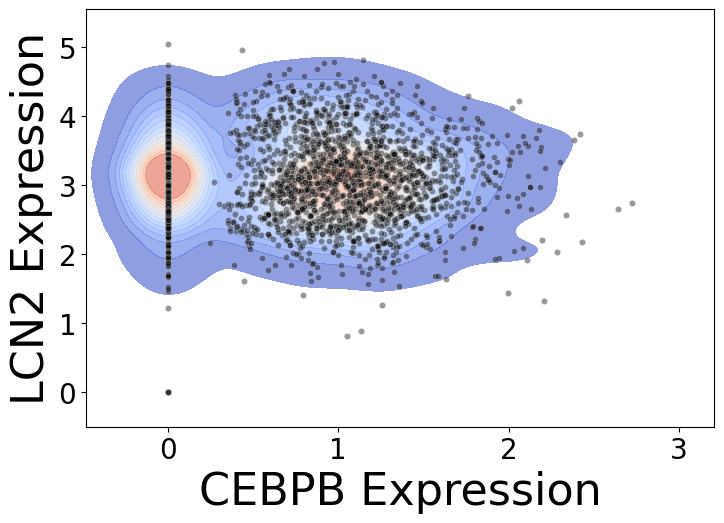

In [694]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy.stats import pearsonr

# 유전자 이름이 중복되지 않도록 설정
adata.var_names_make_unique()

# 관심 유전자
genes = ["CEBPB", "LCN2"]

# 유전자 이름 존재 여부 확인
if all(gene in adata.var_names for gene in genes):
    # 유전자 발현 값 추출
    expression_data = adata[:, genes].X.toarray() if hasattr(adata[:, genes].X, "toarray") else adata[:, genes].X
    expression_df = pd.DataFrame(expression_data, columns=genes, index=adata.obs.index)

    # 상관계수 및 p-value 계산
    correlation, p_value = pearsonr(expression_df[genes[0]], expression_df[genes[1]])

    # 결과 출력
    print(f"Correlation between {genes[0]} and {genes[1]}: {correlation:.2f}")
    print(f"P-value: {p_value:.2e}")

    # 폰트 크기 설정
    plt.rcParams.update({
        "font.size": 32,       # 기본 폰트 크기
        "axes.titlesize": 32,  # 그래프 제목 폰트 크기
        "axes.labelsize": 32,  # 축 라벨 폰트 크기
        "xtick.labelsize": 20, # x축 눈금 폰트 크기
        "ytick.labelsize": 20, # y축 눈금 폰트 크기
        "legend.fontsize": 15, # 범례 폰트 크기
    })

    # 산점도 및 등고선 그리기
    plt.figure(figsize=(8, 6))
    
    # 밀도 등고선 추가
    sns.kdeplot(
        x=expression_df[genes[0]], 
        y=expression_df[genes[1]], 
        fill=True, 
        cmap="coolwarm", 
        alpha=0.6, 
        levels=15, 
        thresh=0.02
    )
    
    # 산점도 추가
    sns.scatterplot(
        x=expression_df[genes[0]], 
        y=expression_df[genes[1]], 
        alpha=0.4, 
        color="black", 
        s=20
    )

    # 그래프 제목 및 축 레이블 설정
    plt.xlabel(f"{genes[0]} Expression")
    plt.ylabel(f"{genes[1]} Expression")
    # plt.title(f"Correlation between {genes[0]} and {genes[1]} (0Layer)")
    
    # 그래프 레이아웃 조정
    plt.tight_layout()
    plt.show()

else:
    print("One or both genes are not found in var_names.")


/tmp/ipykernel_4139828/2550944662.py:21: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  CEBPB_sum = CEBPB_sum.replace('filtered', np.nan).astype(float)
/tmp/ipykernel_4139828/2550944662.py:22: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  CTLA4_sum = CTLA4_sum.replace('filtered', np.nan).astype(float)


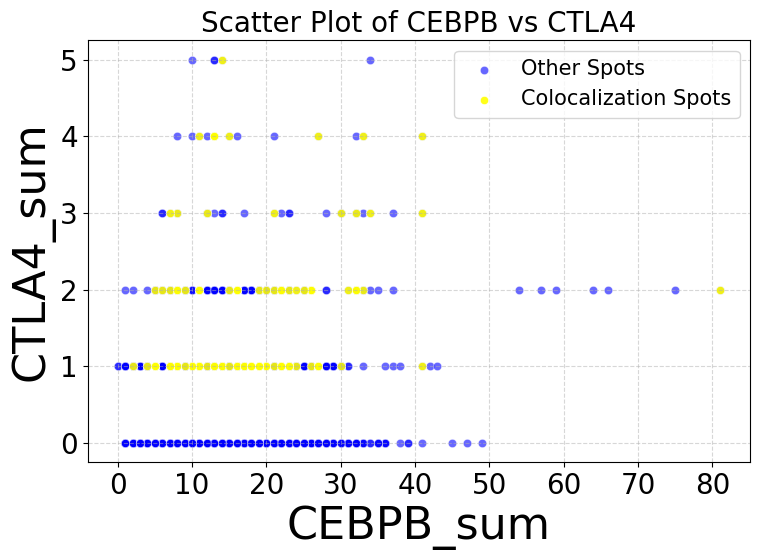

Colocalization spot correlation: 0.18565
Colocalization spot P-value: 5.91887e-02


In [383]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
import numpy as np

# 유전자 이름
genes = ["CEBPB", "CTLA4"]

# adata.X에서 원본 발현 데이터를 추출 (스파스 행렬을 Numpy 배열로 변환)
expression_data = adata[:, genes].X.toarray() if hasattr(adata[:, genes].X, "toarray") else adata[:, genes].X

# CEBPB와 CTLA4의 원본 발현 값
CEBPB_expression = expression_data[:, 0]
CTLA4_expression = expression_data[:, 1]

# 'sum'으로 사용하려는 발현 값 추출 (예시: 이미 계산된 sum 값을 사용)
CEBPB_sum = adata.obs['CEBPB_sum']
CTLA4_sum = adata.obs['CTLA4_sum']

# 'filtered' 값을 NaN으로 바꾸기
CEBPB_sum = CEBPB_sum.replace('filtered', np.nan).astype(float)
CTLA4_sum = CTLA4_sum.replace('filtered', np.nan).astype(float)

# 공발현 조건 (두 유전자 모두 발현량이 0 이상인 경우)
threshold = 0  # 발현량 임계값
yellow_spots_mask = (CEBPB_expression > threshold) & (CTLA4_expression > threshold)

# 공발현하는 좌표 (Yellow spots)
yellow_spots = np.where(yellow_spots_mask)[0]

# Yellow spots에 대해 CEBPB_sum과 CTLA4_sum 간의 상관 계수 및 p-value 계산
yellow_CEBPB_sum = CEBPB_sum.iloc[yellow_spots]
yellow_CTLA4_sum = CTLA4_sum.iloc[yellow_spots]

# NaN 값 제거
yellow_CEBPB_sum_valid = yellow_CEBPB_sum[~yellow_CEBPB_sum.isna()]
yellow_CTLA4_sum_valid = yellow_CTLA4_sum[~yellow_CTLA4_sum.isna()]

# 전체 데이터의 산점도 시각화
plt.figure(figsize=(8, 6))

# 전체 스팟 시각화 (Blue: 나머지 spots)
sns.scatterplot(x=CEBPB_sum, y=CTLA4_sum, color='b', alpha=0.6, label='Other Spots')

# Yellow spots 시각화 (Yellow: 공발현 spots)
sns.scatterplot(x=yellow_CEBPB_sum_valid, y=yellow_CTLA4_sum_valid, color='yellow', alpha=0.9, label='Colocalization Spots')

# 폰트 크기 설정
plt.rcParams.update({
    "font.size": 20,       # 기본 폰트 크기
    "axes.titlesize": 20,  # 그래프 제목 폰트 크기
    "axes.labelsize": 20,  # 축 라벨 폰트 크기
    "xtick.labelsize": 15, # x축 눈금 폰트 크기
    "ytick.labelsize": 15, # y축 눈금 폰트 크기
    "legend.fontsize": 15, # 범례 폰트 크기
})

# 그리드 추가
plt.grid(True, linestyle='--', alpha=0.5)  # 점선 스타일 그리드 추가

# 그래프 설정
plt.title(f'Scatter Plot of CEBPB vs CTLA4')
plt.xlabel('CEBPB_sum')
plt.ylabel('CTLA4_sum')
plt.legend()
plt.tight_layout()
plt.show()

# 상관 계수와 p-value 계산 (공발현 spots만)
if len(yellow_CEBPB_sum_valid) > 1 and len(yellow_CTLA4_sum_valid) > 1:
    yellow_correlation, yellow_p_value = pearsonr(yellow_CEBPB_sum_valid, yellow_CTLA4_sum_valid)
    
    # 결과 출력
    print(f"Colocalization spot correlation: {yellow_correlation:.5f}")
    print(f"Colocalization spot P-value: {yellow_p_value:.5e}")
else:
    print("Not enough yellow spots to calculate correlation and p-value.")


/tmp/ipykernel_4139828/3710251586.py:21: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  CEBPB_sum = CEBPB_sum.replace('filtered', np.nan).astype(float)
/tmp/ipykernel_4139828/3710251586.py:22: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  LCN2_sum = LCN2_sum.replace('filtered', np.nan).astype(float)


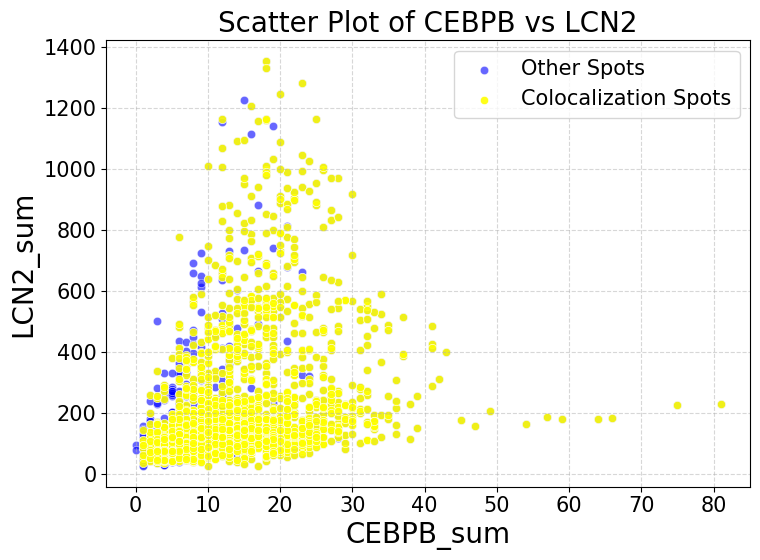

Colocalization spot correlation: 0.29535
Colocalization spot P-value: 5.25255e-36


In [384]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
import numpy as np

# 유전자 이름
genes = ["CEBPB", "LCN2"]

# adata.X에서 원본 발현 데이터를 추출 (스파스 행렬을 Numpy 배열로 변환)
expression_data = adata[:, genes].X.toarray() if hasattr(adata[:, genes].X, "toarray") else adata[:, genes].X

# CEBPB와 LCN2의 원본 발현 값
CEBPB_expression = expression_data[:, 0]
LCN2_expression = expression_data[:, 1]

# 'sum'으로 사용하려는 발현 값 추출 (예시: 이미 계산된 sum 값을 사용)
CEBPB_sum = adata.obs['CEBPB_sum']
LCN2_sum = adata.obs['LCN2_sum']

# 'filtered' 값을 NaN으로 바꾸기
CEBPB_sum = CEBPB_sum.replace('filtered', np.nan).astype(float)
LCN2_sum = LCN2_sum.replace('filtered', np.nan).astype(float)

# 공발현 조건 (두 유전자 모두 발현량이 0 이상인 경우)
threshold = 0  # 발현량 임계값
yellow_spots_mask = (CEBPB_expression > threshold) & (LCN2_expression > threshold)

# 공발현하는 좌표 (Yellow spots)
yellow_spots = np.where(yellow_spots_mask)[0]

# Yellow spots에 대해 CEBPB_sum과 LCN2_sum 간의 상관 계수 및 p-value 계산
yellow_CEBPB_sum = CEBPB_sum.iloc[yellow_spots]
yellow_LCN2_sum = LCN2_sum.iloc[yellow_spots]

# NaN 값 제거
yellow_CEBPB_sum_valid = yellow_CEBPB_sum[~yellow_CEBPB_sum.isna()]
yellow_LCN2_sum_valid = yellow_LCN2_sum[~yellow_LCN2_sum.isna()]

# 전체 데이터의 산점도 시각화
plt.figure(figsize=(8, 6))

# 전체 스팟 시각화 (Blue: 나머지 spots)
sns.scatterplot(x=CEBPB_sum, y=LCN2_sum, color='b', alpha=0.6, label='Other Spots')

# Yellow spots 시각화 (Yellow: 공발현 spots)
sns.scatterplot(x=yellow_CEBPB_sum_valid, y=yellow_LCN2_sum_valid, color='yellow', alpha=0.9, label='Colocalization Spots')

# 폰트 크기 설정
plt.rcParams.update({
    "font.size": 20,       # 기본 폰트 크기
    "axes.titlesize": 20,  # 그래프 제목 폰트 크기
    "axes.labelsize": 20,  # 축 라벨 폰트 크기
    "xtick.labelsize": 15, # x축 눈금 폰트 크기
    "ytick.labelsize": 15, # y축 눈금 폰트 크기
    "legend.fontsize": 15, # 범례 폰트 크기
})

# 그리드 추가
plt.grid(True, linestyle='--', alpha=0.5)  # 점선 스타일 그리드 추가

# 그래프 설정
plt.title(f'Scatter Plot of CEBPB vs LCN2')
plt.xlabel('CEBPB_sum')
plt.ylabel('LCN2_sum')
plt.legend()
plt.tight_layout()
plt.show()

# 상관 계수와 p-value 계산 (공발현 spots만)
if len(yellow_CEBPB_sum_valid) > 1 and len(yellow_LCN2_sum_valid) > 1:
    yellow_correlation, yellow_p_value = pearsonr(yellow_CEBPB_sum_valid, yellow_LCN2_sum_valid)
    
    # 결과 출력
    print(f"Colocalization spot correlation: {yellow_correlation:.5f}")
    print(f"Colocalization spot P-value: {yellow_p_value:.5e}")
else:
    print("Not enough yellow spots to calculate correlation and p-value.")


In [158]:
import os
import scanpy as sc
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
from scipy.sparse import issparse

def calculate_correlation_and_pvalue(adata, gene_pairs, distance_thresholds):
    """
    지정된 distance_threshold에 따라 correlation과 p-value를 계산하여 데이터프레임으로 반환.

    Parameters:
        adata: AnnData 객체
        gene_pairs: 계산할 유전자 쌍의 리스트 (각각 2개의 유전자 이름의 튜플)
        distance_thresholds: 거리 임계값 리스트

    Returns:
        결과 데이터프레임 (index: distance_threshold, columns: correlation, p-value for each pair)
    """
    results = []

    for threshold in distance_thresholds:
        row = {"distance_threshold": threshold}
        for gene_pair in gene_pairs:
            gene1, gene2 = gene_pair
            
            # 유전자 발현 합계 계산
            calculate_gene_sums_for_all(adata, [gene1, gene2], distance_threshold=threshold)
            
            # 'filtered' 제거 후 계산
            filtered_data = adata.obs[[f"{gene1}_sum", f"{gene2}_sum"]].replace("filtered", np.nan).dropna()
            
            # 상관계수 및 p-value 계산
            if len(filtered_data) > 1:  # 데이터가 최소 2개 이상이어야 계산 가능
                correlation, p_value = pearsonr(
                    filtered_data[f"{gene1}_sum"], 
                    filtered_data[f"{gene2}_sum"]
                )
            else:
                correlation, p_value = np.nan, np.nan

            # 결과 저장
            row[f"{gene1}_vs_{gene2}_correlation"] = correlation
            row[f"{gene1}_vs_{gene2}_p_value"] = p_value
        
        results.append(row)

    return pd.DataFrame(results).set_index("distance_threshold")


def process_multiple_folders(base_dir, folders, gene_pairs, distance_thresholds):
    """
    여러 폴더에 대해 분석을 수행하고 결과를 출력.

    Parameters:
        base_dir: 데이터가 저장된 기본 경로
        folders: 분석할 폴더 리스트
        gene_pairs: 계산할 유전자 쌍 리스트
        distance_thresholds: 거리 임계값 리스트
    """
    for folder in folders:
        print(f"\n=== Processing folder: {folder} ===\n")
        # 데이터 불러오기
        data_path = os.path.join(base_dir, folder)
        adata = sc.read_visium(data_path)

        # 좌표 추가
        spatial_df = pd.DataFrame(
            adata.obsm['spatial'], 
            columns=['x', 'y'], 
            index=adata.obs.index
        )
        adata.obs['x'] = spatial_df['x']
        adata.obs['y'] = spatial_df['y']

        # 상관계수 및 p-value 계산
        folder_results = calculate_correlation_and_pvalue(adata, gene_pairs, distance_thresholds)
        
        # 결과 출력
        print(folder_results)


# 기본 경로 및 폴더 설정
base_directory = "/home/Data_Drive_8TB_3/Coloncancer/Visium/NPJ_data/ST_prj/"
folders_to_analyze = [
    "SN123_A551763_Rep1",
    "SN048_A416371_Rep1",
    "SN048_A416371_Rep2",
    "SN048_A121573_Rep2"
]

# 분석할 유전자 쌍 및 거리 임계값 설정
gene_pairs_to_analyze = [("CEBPB", "LCN2"), ("CEBPB", "CTLA4")]
distance_thresholds_to_analyze = [1,30, 60, 85, 105, 135, 159.5]

# 분석 실행 및 출력
process_multiple_folders(
    base_dir=base_directory,
    folders=folders_to_analyze,
    gene_pairs=gene_pairs_to_analyze,
    distance_thresholds=distance_thresholds_to_analyze
)



=== Processing folder: SN123_A551763_Rep1 ===



/home/user/anaconda3/envs/kykim/lib/python3.12/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/user/anaconda3/envs/kykim/lib/python3.12/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


모든 스팟에 대해 유전자 발현 합계 및 필터링된 스팟 개수를 계산했습니다.
모든 스팟에 대해 유전자 발현 합계 및 필터링된 스팟 개수를 계산했습니다.
모든 스팟에 대해 유전자 발현 합계 및 필터링된 스팟 개수를 계산했습니다.
모든 스팟에 대해 유전자 발현 합계 및 필터링된 스팟 개수를 계산했습니다.


KeyboardInterrupt: 

In [ ]:
import os
import scanpy as sc
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
from scipy.sparse import issparse

def calculate_correlation_and_pvalue(adata, gene_pairs, distance_thresholds):
    """
    지정된 distance_threshold에 따라 correlation과 p-value를 계산하여 데이터프레임으로 반환.

    Parameters:
        adata: AnnData 객체
        gene_pairs: 계산할 유전자 쌍의 리스트 (각각 2개의 유전자 이름의 튜플)
        distance_thresholds: 거리 임계값 리스트

    Returns:
        결과 데이터프레임 (index: distance_threshold, columns: correlation, p-value for each pair)
    """
    results = []

    for threshold in distance_thresholds:
        row = {"distance_threshold": threshold}
        for gene_pair in gene_pairs:
            gene1, gene2 = gene_pair
            
            # 유전자 발현 합계 계산
            calculate_gene_sums_for_all(adata, [gene1, gene2], distance_threshold=threshold)
            
            # 'filtered' 제거 후 계산
            filtered_data = adata.obs[[f"{gene1}_sum", f"{gene2}_sum"]].replace("filtered", np.nan).dropna()
            
            # 상관계수 및 p-value 계산
            if len(filtered_data) > 1:  # 데이터가 최소 2개 이상이어야 계산 가능
                correlation, p_value = pearsonr(
                    filtered_data[f"{gene1}_sum"], 
                    filtered_data[f"{gene2}_sum"]
                )
            else:
                correlation, p_value = np.nan, np.nan

            # 결과 저장
            row[f"{gene1}_vs_{gene2}_correlation"] = correlation
            row[f"{gene1}_vs_{gene2}_p_value"] = p_value
        
        results.append(row)

    return pd.DataFrame(results).set_index("distance_threshold")


def process_multiple_folders(base_dir, folders, gene_pairs, distance_thresholds):
    """
    여러 폴더에 대해 분석을 수행하고 결과를 출력.

    Parameters:
        base_dir: 데이터가 저장된 기본 경로
        folders: 분석할 폴더 리스트
        gene_pairs: 계산할 유전자 쌍 리스트
        distance_thresholds: 거리 임계값 리스트
    """
    for folder in folders:
        print(f"\n=== Processing folder: {folder} ===\n")
        # 데이터 불러오기
        data_path = os.path.join(base_dir, folder)
        adata = sc.read_visium(data_path)

        # 데이터 정규화 및 로그 변환
        sc.pp.normalize_total(adata, inplace=True)
        sc.pp.log1p(adata)

        # 좌표 추가
        spatial_df = pd.DataFrame(
            adata.obsm['spatial'], 
            columns=['x', 'y'], 
            index=adata.obs.index
        )
        adata.obs['x'] = spatial_df['x']
        adata.obs['y'] = spatial_df['y']

        # 상관계수 및 p-value 계산
        folder_results = calculate_correlation_and_pvalue(adata, gene_pairs, distance_thresholds)
        
        # 결과 출력
        print(folder_results)


# 기본 경로 및 폴더 설정
base_directory = "/home/Data_Drive_8TB_3/Coloncancer/Visium/NPJ_data/ST_prj/"
folders_to_analyze = [
    "SN123_A551763_Rep1",
    "SN048_A416371_Rep1",
    "SN048_A416371_Rep2",
    "SN048_A121573_Rep2"
]

# 분석할 유전자 쌍 및 거리 임계값 설정
gene_pairs_to_analyze = [("CEBPB", "LCN2"), ("CEBPB", "CTLA4")]
distance_thresholds_to_analyze = [1, 30, 60, 85, 105, 135, 159.5]

# 분석 실행 및 출력
process_multiple_folders(
    base_dir=base_directory,
    folders=folders_to_analyze,
    gene_pairs=gene_pairs_to_analyze,
    distance_thresholds=distance_thresholds_to_analyze
)



=== Processing folder: SN123_A551763_Rep1 ===



/home/user/anaconda3/envs/kykim/lib/python3.12/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/user/anaconda3/envs/kykim/lib/python3.12/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


  Distance threshold: 30um


/tmp/ipykernel_4139942/2566039098.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[f"{gene}_sum"] = sum_values
/tmp/ipykernel_4139942/2566039098.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[f"{gene}_sum"] = sum_values
/tmp/ipykernel_4139942/2566039098.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented fra

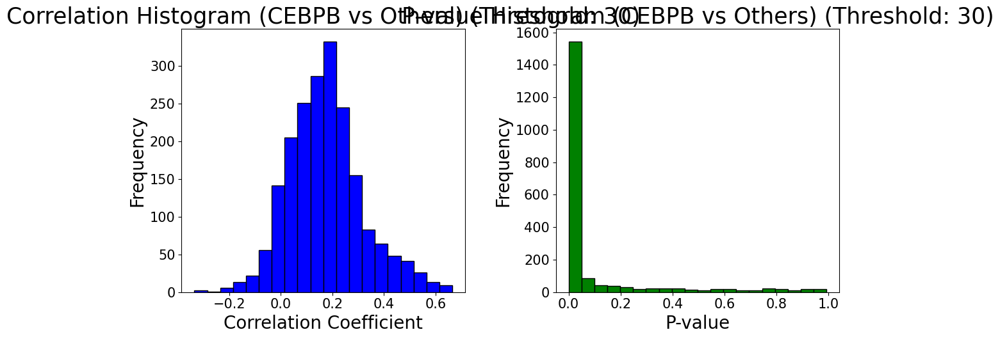

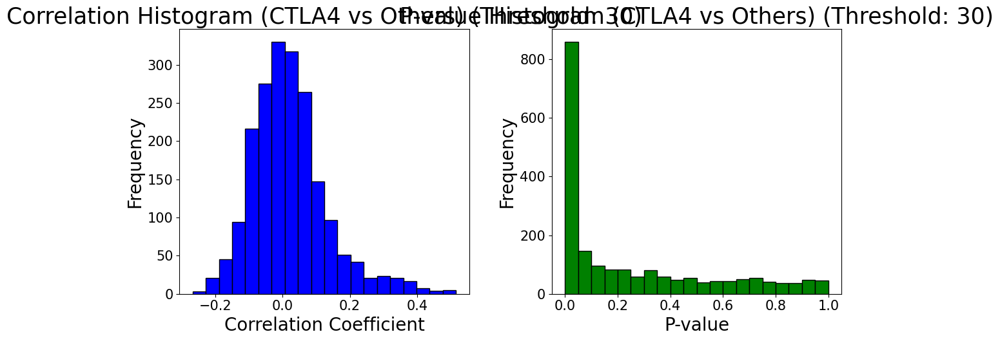


=== Processing folder: SN048_A416371_Rep1 ===



/home/user/anaconda3/envs/kykim/lib/python3.12/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/user/anaconda3/envs/kykim/lib/python3.12/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


  Distance threshold: 30um


/tmp/ipykernel_4139942/2566039098.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[f"{gene}_sum"] = sum_values
/tmp/ipykernel_4139942/2566039098.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[f"{gene}_sum"] = sum_values
/tmp/ipykernel_4139942/2566039098.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented fra

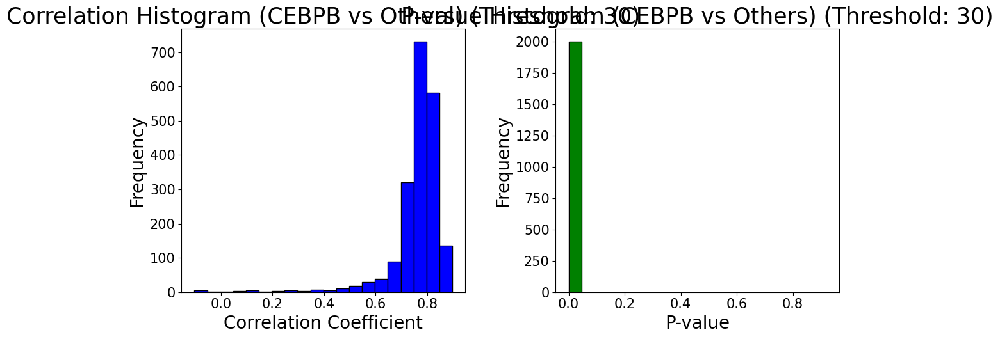

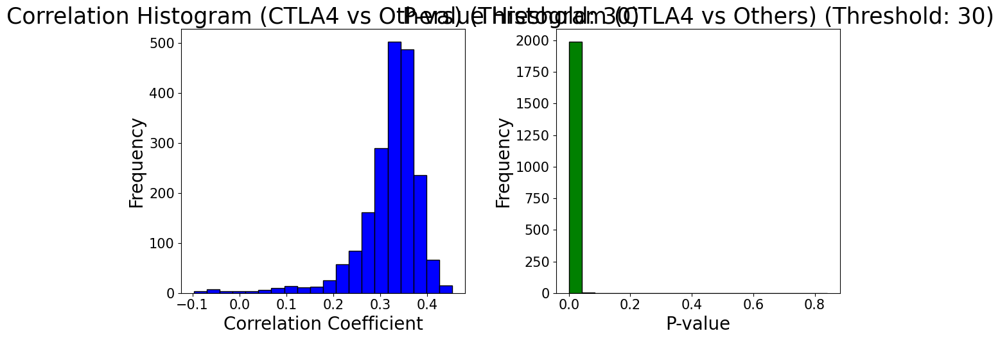


=== Processing folder: SN048_A416371_Rep2 ===



/home/user/anaconda3/envs/kykim/lib/python3.12/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/user/anaconda3/envs/kykim/lib/python3.12/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


  Distance threshold: 30um


/tmp/ipykernel_4139942/2566039098.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[f"{gene}_sum"] = sum_values
/tmp/ipykernel_4139942/2566039098.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[f"{gene}_sum"] = sum_values
/tmp/ipykernel_4139942/2566039098.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented fra

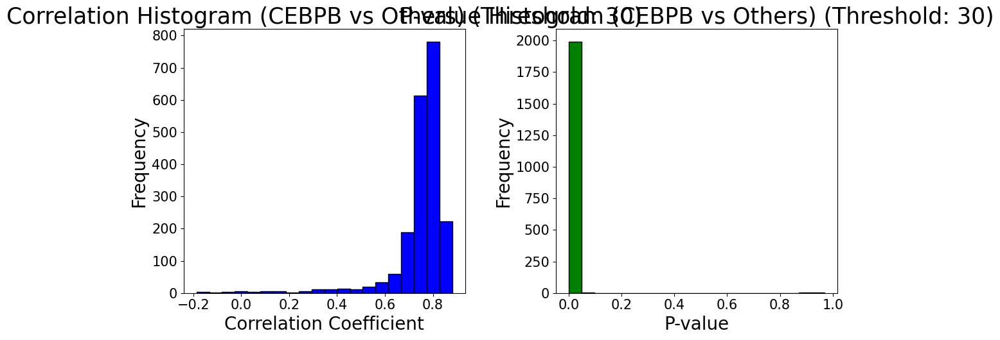

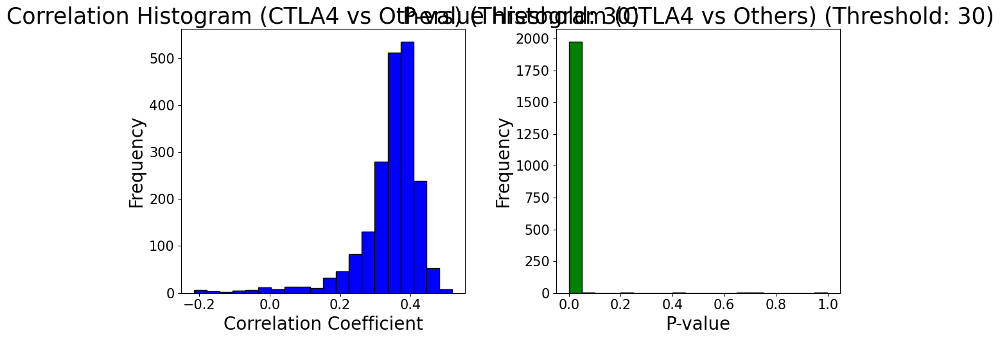


=== Processing folder: SN048_A121573_Rep2 ===



/home/user/anaconda3/envs/kykim/lib/python3.12/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/user/anaconda3/envs/kykim/lib/python3.12/site-packages/anndata/_core/anndata.py:1758: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


  Distance threshold: 30um


/tmp/ipykernel_4139942/2566039098.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[f"{gene}_sum"] = sum_values
/tmp/ipykernel_4139942/2566039098.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  adata.obs[f"{gene}_sum"] = sum_values
/tmp/ipykernel_4139942/2566039098.py:49: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented fra

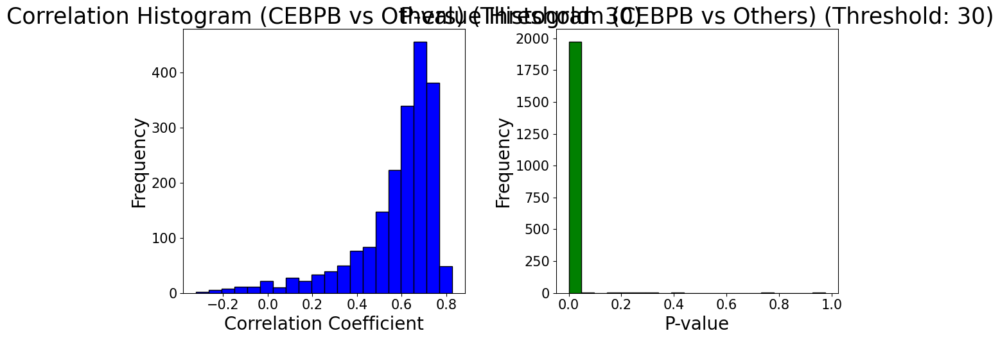

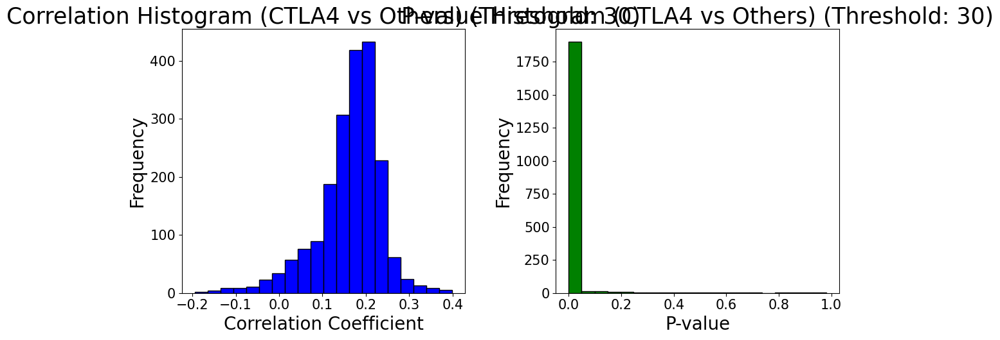

In [27]:
import os
import scanpy as sc
import pandas as pd
import numpy as np
from scipy.stats import pearsonr
import matplotlib.pyplot as plt

def calculate_gene_sums_for_all(adata, genes, distance_threshold):
    """
    주어진 거리 내에서 각 유전자의 발현 합계를 계산하여 adata.obs에 추가합니다.

    Parameters:
        adata: AnnData 객체
        genes: 유전자 리스트
        distance_threshold: 거리 임계값 (um)
    """
    # spatial 좌표 정보
    spatial_coords = adata.obsm['spatial']

    # 길이 확인 및 정렬
    if spatial_coords.shape[0] != adata.n_obs:
        raise ValueError("`spatial_coords`와 `adata.n_obs`가 일치하지 않습니다. 데이터를 확인하세요.")

    # 데이터에 존재하는 유전자만 선택
    existing_genes = [gene for gene in genes if gene in adata.var_names]
    missing_genes = [gene for gene in genes if gene not in adata.var_names]

    if missing_genes:
        print(f"경고: 다음 유전자는 데이터에 존재하지 않습니다. 제외됩니다: {missing_genes}")

    # 각 유전자에 대해 발현 합계 계산
    for gene in existing_genes:
        gene_expression = adata[:, gene].X.toarray().flatten()  # 유전자 발현 값

        if len(gene_expression) != spatial_coords.shape[0]:
            raise ValueError(f"유전자 {gene}의 발현 데이터 길이와 `spatial_coords` 길이가 일치하지 않습니다.")

        # 계산된 유전자 발현 값을 'sum' 컬럼으로 adata.obs에 저장
        sum_values = []
        for i, coord in enumerate(spatial_coords):
            distances = np.linalg.norm(spatial_coords - coord, axis=1)  # 해당 spot과 다른 spot들 간의 거리 계산
            nearby_spots = distances < distance_threshold  # 주어진 거리 임계값 내에 있는 spot들

            # 거리 내에 있는 spot들의 발현 값 합
            nearby_expression_sum = gene_expression[nearby_spots].sum()
            sum_values.append(nearby_expression_sum)

        # 유전자 발현 합을 adata.obs에 추가
        adata.obs[f"{gene}_sum"] = sum_values


def select_top_genes_by_expression(adata, top_n=10000):
    """
    발현 값이 많은 상위 N개의 유전자를 선택합니다.
    
    Parameters:
        adata: AnnData 객체
        top_n: 선택할 상위 유전자 개수 (기본값: 10000)
        
    Returns:
        top_genes: 발현 값이 많은 상위 N개의 유전자 리스트
    """
    # 각 유전자의 발현 값 합을 계산
    gene_sums = np.array(adata.X.sum(axis=0)).flatten()

    # 유전자 이름과 발현 합계를 DataFrame으로 만들어 정렬
    gene_sum_df = pd.DataFrame({
        "gene": adata.var_names,
        "sum": gene_sums
    })

    # 발현 값이 높은 상위 N개의 유전자 선택
    top_genes = gene_sum_df.sort_values(by="sum", ascending=False).head(top_n)["gene"].tolist()
    
    return top_genes


def calculate_correlation_and_pvalue_for_target_and_top_others(adata, target_genes, distance_threshold, top_genes):
    """
    목표 유전자와 상위 유전자들 간의 상관계수 및 p-value를 계산합니다.
    
    Parameters:
        adata: AnnData 객체
        target_genes: 분석할 목표 유전자 리스트
        distance_threshold: 거리 임계값
        top_genes: 발현이 많은 상위 유전자 리스트
    
    Returns:
        결과 DataFrame (target_gene, other_gene, correlation, p_value)
    """
    results = []

    # 주어진 거리 임계값으로 각 유전자의 발현 합계 계산
    calculate_gene_sums_for_all(adata, target_genes + top_genes, distance_threshold)

    # 목표 유전자와 상위 유전자들 간의 상관계수 계산
    for target_gene in target_genes:
        for other_gene in top_genes:
            if target_gene == other_gene:
                continue

            # 상관계수 및 p-value 계산
            target_values = adata.obs[f"{target_gene}_sum"]
            other_values = adata.obs[f"{other_gene}_sum"]
            correlation, p_value = pearsonr(target_values, other_values)

            # 결과 저장
            results.append({
                "target_gene": target_gene,
                "other_gene": other_gene,
                "correlation": correlation,
                "p_value": p_value
            })

    return pd.DataFrame(results)


def process_multiple_folders_and_plot_for_target_and_top_others(base_dir, folders, target_genes, distance_thresholds, top_n=10000):
    """
    여러 폴더에 대해 분석을 수행하고 목표 유전자와 발현이 많은 상위 유전자 간의 상관관계 및 p-value 히스토그램을 출력.

    Parameters:
        base_dir: 데이터가 저장된 기본 경로
        folders: 분석할 폴더 리스트
        target_genes: 분석할 목표 유전자 리스트
        distance_thresholds: 거리 임계값 리스트
        top_n: 발현이 많은 유전자 개수 (기본값: 10000)
    """
    for folder in folders:
        print(f"\n=== Processing folder: {folder} ===\n")
        # 데이터 불러오기
        data_path = os.path.join(base_dir, folder)
        adata = sc.read_visium(data_path)

        # 좌표 추가
        spatial_df = pd.DataFrame(
            adata.obsm['spatial'], 
            columns=['x', 'y'], 
            index=adata.obs.index
        )
        adata.obs['x'] = spatial_df['x']
        adata.obs['y'] = spatial_df['y']

        # 발현이 많은 상위 top_n개의 유전자 선택
        top_genes = select_top_genes_by_expression(adata, top_n=top_n)

        # 각 거리 임계값에 대해 분석
        for threshold in distance_thresholds:
            print(f"  Distance threshold: {threshold}um")
            
            # 상관계수 및 p-value 계산
            correlation_results = calculate_correlation_and_pvalue_for_target_and_top_others(
                adata, target_genes, distance_threshold=threshold, top_genes=top_genes
            )

            # 히스토그램 출력 (상관계수, p-value)
            for target_gene in target_genes:
                target_results = correlation_results[correlation_results["target_gene"] == target_gene]

                # 히스토그램 출력
                fig, axes = plt.subplots(1, 2, figsize=(12, 6))
                axes[0].hist(target_results["correlation"].dropna(), bins=20, color='blue', edgecolor='black')
                axes[0].set_title(f"Correlation Histogram ({target_gene} vs Others) (Threshold: {threshold})")
                axes[0].set_xlabel("Correlation Coefficient")
                axes[0].set_ylabel("Frequency")
                
                axes[1].hist(target_results["p_value"].dropna(), bins=20, color='green', edgecolor='black')
                axes[1].set_title(f"P-value Histogram ({target_gene} vs Others) (Threshold: {threshold})")
                axes[1].set_xlabel("P-value")
                axes[1].set_ylabel("Frequency")

                plt.tight_layout()
                plt.show()


# 기본 경로 및 폴더 설정
base_directory = "/home/Data_Drive_8TB_3/Coloncancer/Visium/NPJ_data/ST_prj/"
folders_to_analyze = [
    "SN123_A551763_Rep1",
    "SN048_A416371_Rep1",
    "SN048_A416371_Rep2",
    "SN048_A121573_Rep2"
]

# 분석할 목표 유전자 설정
target_genes_to_analyze = ["CEBPB","CTLA4"]

# 거리 임계값 설정
distance_thresholds_to_analyze = [30]  # 7um으로 설정

# 분석 실행 및 출력
process_multiple_folders_and_plot_for_target_and_top_others(
    base_dir=base_directory,
    folders=folders_to_analyze,
    target_genes=target_genes_to_analyze,
    distance_thresholds=distance_thresholds_to_analyze,
    top_n=2000  # 발현이 많은 유전자를 10,000개로 제한
)


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.sparse import issparse

# 발현 유전자 리스트
genes_of_interest = ['COL3A1', 'COL1A1', 'COL1A2']

# 선택된 유전자의 총 발현 값 계산
combined_expression = None

for gene in genes_of_interest:
    if gene in adata.var_names:
        # 유전자 발현 값 가져오기
        expression_values = (
            adata[:, gene].X.toarray().flatten() if issparse(adata[:, gene].X) 
            else adata[:, gene].X.flatten()
        )
        # 발현 값을 합산
        if combined_expression is None:
            combined_expression = expression_values
        else:
            combined_expression += expression_values
    else:
        print(f"Gene {gene} not found in the dataset.")

# 상대적 발현 수준 정규화 (0~1)
if combined_expression is not None:
    # NaN 방지: 모든 값이 0인 경우 대비
    combined_expression = (combined_expression - np.min(combined_expression)) / (
        np.max(combined_expression) - np.min(combined_expression) + 1e-9
    )

    # 스팟 좌표
    spots_coords = adata.obsm['spatial']
    
    # 플롯 생성
    plt.figure(figsize=(8, 6))
    
    # 상대적 발현 값이 0 미만인 스팟 (검정색)
    plt.scatter(
        spots_coords[combined_expression == 0, 0],
        spots_coords[combined_expression == 0, 1],
        c='black', alpha=0.6, label='No Expression'
    )
    
    # 상대적 발현 값이 0 이상인 스팟 (Blues 컬러맵)
    scatter = plt.scatter(
        spots_coords[combined_expression > 0, 0],
        spots_coords[combined_expression > 0, 1],
        c=combined_expression[combined_expression > 0],
        cmap='Blues', alpha=0.6, label='Relative Expression'
    )
    
    # 플롯 꾸미기
    plt.title('Combined Relative Expression of Genes (COL3A1,COL1A1,COL1A2)', fontsize=8)
    plt.xlabel('X Coordinate', fontsize=12)
    plt.ylabel('Y Coordinate', fontsize=12)
    plt.colorbar(scatter, label='Relative Expression Level')  # 컬러바 추가
    plt.legend(title='Legend', fontsize=12)
    plt.show()
else:
    print("No valid genes found for plotting.")


In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.sparse import issparse
from scipy.interpolate import griddata

# 발현 유전자 리스트
genes_of_interest = ['COL3A1', 'COL1A1', 'COL1A2']

# 선택된 유전자의 총 발현 값 계산
combined_expression = None

for gene in genes_of_interest:
    if gene in adata.var_names:
        # 유전자 발현 값 가져오기
        expression_values = (
            adata[:, gene].X.toarray().flatten() if issparse(adata[:, gene].X) 
            else adata[:, gene].X.flatten()
        )
        # 발현 값을 합산
        if combined_expression is None:
            combined_expression = expression_values
        else:
            combined_expression += expression_values
    else:
        print(f"Gene {gene} not found in the dataset.")

# 상대적 발현 수준 정규화 (0~1)
if combined_expression is not None:
    # NaN 방지: 모든 값이 0인 경우 대비
    combined_expression = (combined_expression - np.min(combined_expression)) / (
        np.max(combined_expression) - np.min(combined_expression) + 1e-9
    )

    # 스팟 좌표
    spots_coords = adata.obsm['spatial']
    
    # 격자 생성
    grid_x, grid_y = np.mgrid[
        spots_coords[:, 0].min():spots_coords[:, 0].max():500j,
        spots_coords[:, 1].min():spots_coords[:, 1].max():500j
    ]
    
    # 격자화된 발현 데이터
    grid_expression = griddata(
        spots_coords, combined_expression, (grid_x, grid_y), method='linear'
    )
    
    # 플롯 생성
    plt.figure(figsize=(8, 6))
    
    # 상대적 발현 값이 0 미만인 스팟 (검정색)
    plt.scatter(
        spots_coords[combined_expression == 0, 0],
        spots_coords[combined_expression == 0, 1],
        c='black', alpha=0.6, label='No Expression'
    )
    
    # 상대적 발현 값이 0 이상인 스팟 (Blues 컬러맵)
    scatter = plt.scatter(
        spots_coords[combined_expression > 0, 0],
        spots_coords[combined_expression > 0, 1],
        c=combined_expression[combined_expression > 0],
        cmap='Blues', alpha=0.6, label='Relative Expression'
    )
    
    # 경계선 그리기
    plt.contour(
        grid_x, grid_y, grid_expression, levels=[0.48],
        colors='red', linewidths=1.5, linestyles='dashed', label='Threshold (0.48)'
    )
    
    # 플롯 꾸미기
    plt.title('Combined Relative Expression of Genes (COL3A1,COL1A1,COL1A2)', fontsize=8)
    plt.xlabel('X Coordinate', fontsize=12)
    plt.ylabel('Y Coordinate', fontsize=12)
    plt.colorbar(scatter, label='Relative Expression Level')  # 컬러바 추가
    plt.legend(title='Legend', fontsize=12)
    plt.show()
else:
    print("No valid genes found for plotting.")


In [ ]:
import pandas as pd
import numpy as np
from scipy.sparse import issparse

# 발현 유전자 리스트
genes_of_interest = ['COL3A1', 'COL1A1', 'COL1A2']

# 선택된 유전자의 총 발현 값 계산
combined_expression = None

for gene in genes_of_interest:
    if gene in adata.var_names:
        # 유전자 발현 값 가져오기
        expression_values = (
            adata[:, gene].X.toarray().flatten() if issparse(adata[:, gene].X) 
            else adata[:, gene].X.flatten()
        )
        # 발현 값을 합산
        if combined_expression is None:
            combined_expression = expression_values
        else:
            combined_expression += expression_values
    else:
        print(f"Gene {gene} not found in the dataset.")

# 상대적 발현 수준 정규화 (0~1)
if combined_expression is not None:
    combined_expression = (combined_expression - np.min(combined_expression)) / (
        np.max(combined_expression) - np.min(combined_expression) + 1e-9
    )

    # 스팟 좌표
    spots_coords = adata.obsm['spatial']
    
    # 0.4 미만인 좌표만 저장
    low_expression_filter = combined_expression < 0.30
    low_expression_coords = np.where(
        low_expression_filter[:, None], spots_coords, np.nan
    )

    # `adata.obs`에 저장
    adata.obs['low_expression_x'] = low_expression_coords[:, 0]
    adata.obs['low_expression_y'] = low_expression_coords[:, 1]

    print("Low expression coordinates added to adata.obs:")
    print(adata.obs[['low_expression_x', 'low_expression_y']].head())
else:
    print("No valid genes found for processing.")


In [ ]:
adata.obs['low_expression_x']

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr
import numpy as np

# 'filtered'로 지정된 데이터 제외
filtered_data = adata.obs[['LCN2_sum', 'CTLA4_sum', 'low_expression_x']].replace('filtered', np.nan).dropna(subset=['LCN2_sum', 'CTLA4_sum'])

# 'low_expression_x'가 NaN인 데이터는 High Fibroblast Expression으로 간주
high_fibro_filter = filtered_data['low_expression_x'].isna()
low_fibro_filter = ~high_fibro_filter  # 'low_expression_x'가 NaN이 아닌 데이터는 Low Fibroblast Expression

# High Fibroblast Expression: 상관 계수 및 p-value 계산
high_corr, high_p_value = pearsonr(
    filtered_data.loc[high_fibro_filter, 'LCN2_sum'], 
    filtered_data.loc[high_fibro_filter, 'CTLA4_sum']
)

# Low Fibroblast Expression: 상관 계수 및 p-value 계산
low_corr, low_p_value = pearsonr(
    filtered_data.loc[low_fibro_filter, 'LCN2_sum'], 
    filtered_data.loc[low_fibro_filter, 'CTLA4_sum']
)

# 산점도 시각화
plt.figure(figsize=(8, 6))

# High Fibroblast Expression (파란색)
sns.scatterplot(
    x=filtered_data.loc[high_fibro_filter, 'LCN2_sum'], 
    y=filtered_data.loc[high_fibro_filter, 'CTLA4_sum'], 
    color='b', alpha=0.5, label='High Fibroblast Expression'
)

# Low Fibroblast Expression (빨간색)
plt.scatter(
    filtered_data.loc[low_fibro_filter, 'LCN2_sum'],
    filtered_data.loc[low_fibro_filter, 'CTLA4_sum'],
    color='r', alpha=0.5, label='Low Fibroblast Expression'
)

# 상관 계수와 p-value 텍스트 추가
plt.title(f'Scatter Plot of LCN2_sum vs CTLA4_sum\n'
          f'High Fibro Corr: {high_corr:.2f} (p={high_p_value:.2e}) | '
          f'Low Fibro Corr: {low_corr:.2f} (p={low_p_value:.2e})')
plt.xlabel('LCN2_sum')
plt.ylabel('CTLA4_sum')
plt.grid(True)
plt.legend()

# 플롯 표시
plt.show()

# 상관 계수와 p-value 출력
print(f"High Fibroblast Expression:")
print(f"  Correlation: {high_corr:.2f}")
print(f"  p-value: {high_p_value:.2e}\n")

print(f"Low Fibroblast Expression:")
print(f"  Correlation: {low_corr:.2f}")
print(f"  p-value: {low_p_value:.2e}\n")

# 전체 스팟 개수
total_spots = adata.obs.shape[0]

# 'filtered'로 지정된 데이터 개수
filtered_count = (adata.obs[['LCN2_sum', 'CTLA4_sum']] == 'filtered').any(axis=1).sum()

# 계산에 사용된 데이터 개수
valid_count = total_spots - filtered_count

# 결과 출력
print(f"Filtered spots: {filtered_count}")
print(f"Calculated spots: {valid_count}")


In [ ]:
adata.obs

In [1174]:
import scanpy as sc

# 파일 경로 지정
data_path = "/home/Data_Drive_8TB_3/Coloncancer/Visium/NPJ_data/SN124_A938797_Rep2/SN124_A938797_Rep2/filtered_feature_bc_matrix/"

# AnnData 객체로 데이터 불러오기
adata = sc.read_10x_mtx(
    data_path,            # matrix.mtx.gz 파일이 있는 디렉토리 경로
    var_names='gene_symbols',  # features.tsv.gz에서 gene symbol 사용
    cache=True            # 캐시를 사용하여 빠르게 불러오기
)

# 결과 출력
print(adata)


AnnData object with n_obs × n_vars = 1691 × 36601
    var: 'gene_ids', 'feature_types'


In [1175]:
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

<Axes: xlabel='n_genes_by_counts', ylabel='Count'>

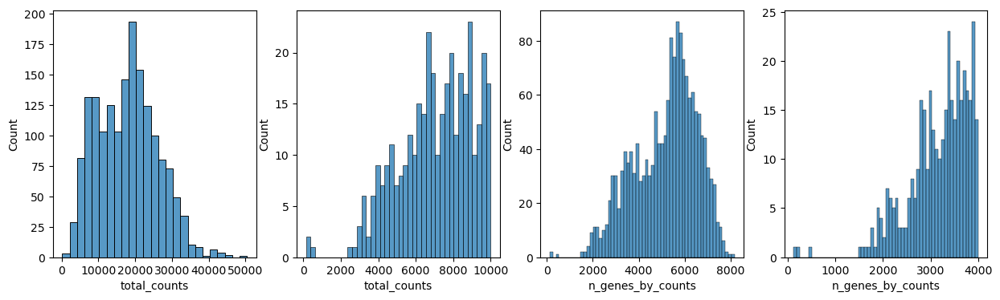

In [1176]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.histplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.histplot(
    adata.obs["total_counts"][adata.obs["total_counts"] < 10000],
    kde=False,
    bins=40,
    ax=axs[1],
)
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.histplot(
    adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000],
    kde=False,
    bins=60,
    ax=axs[3],
)

In [1177]:
sc.pp.filter_cells(adata, min_counts=5000)
sc.pp.filter_cells(adata, max_counts=35000)
adata = adata[adata.obs["pct_counts_mt"] < 20].copy()
print(f"#cells after MT filter: {adata.n_obs}")
sc.pp.filter_genes(adata, min_cells=10)

#cells after MT filter: 1597


In [1178]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

In [1179]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(
    adata, key_added="clusters", flavor="igraph", directed=False, n_iterations=2
)

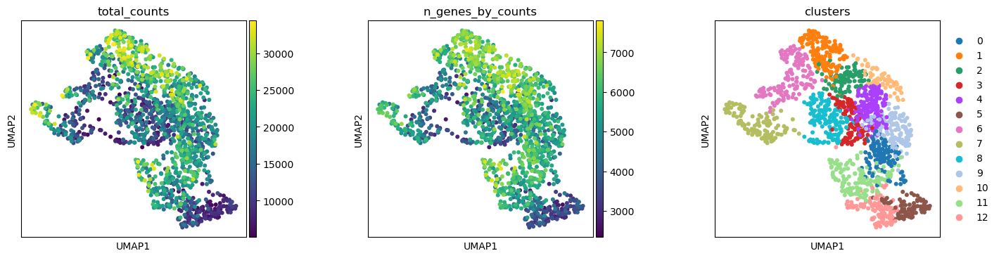

In [1180]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "clusters"], wspace=0.4)

In [1181]:
import json
from pathlib import Path
import matplotlib.pyplot as plt
import scanpy as sc
from pathlib import Path
data_path = Path("/home/Data_Drive_8TB_3/Coloncancer/Visium/NPJ_data/SN124_A938797_Rep2/SN124_A938797_Rep2/")
spatial_path = data_path / "spatial/"

with open(spatial_path / "scalefactors_json.json", "r") as f:
    scalefactors = json.load(f)

# AnnData 객체의 .uns['spatial']에 정보 추가
adata.uns['spatial'] = {
    'library_id': {
        'images': {
            'hires': plt.imread(spatial_path / "tissue_hires_image.png"),
            'lowres': plt.imread(spatial_path / "tissue_lowres_image.png"),
            'detect': plt.imread(spatial_path / 'aligned_fiducials.jpg')
        },
        'scalefactors': scalefactors,
        'spot_diameter_fullres': scalefactors['spot_diameter_fullres']
    }
}

In [1182]:
import pandas as pd
import scanpy as sc

# 파일 경로 설정
positions_path = "/home/Data_Drive_8TB_3/Coloncancer/Visium/NPJ_data/SN124_A938797_Rep2/SN124_A938797_Rep2/spatial/tissue_positions_list.csv"

# 공간 좌표 파일 로드
positions = pd.read_csv(positions_path, header=None)
positions.columns = [
    "barcode", "in_tissue", "array_row", "array_col", "pxl_row_in_fullres", "pxl_col_in_fullres"
]

# AnnData 객체에 좌표 추가
# 바코드와 매칭하여 순서 정렬
adata.obs['barcode'] = adata.obs_names
adata = adata[adata.obs['barcode'].isin(positions['barcode'])]  # 바코드 일치 확인
adata.obs = adata.obs.merge(positions, left_on="barcode", right_on="barcode", how="left")

# .obsm['spatial']에 좌표 추가
adata.obsm['spatial'] = adata.obs[['pxl_row_in_fullres', 'pxl_col_in_fullres']].to_numpy()


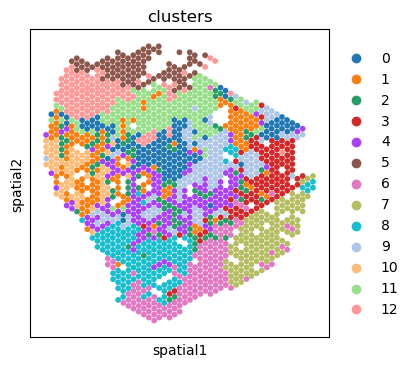

In [1183]:
# 이미지를 빼고 클러스터 정보만 시각화
sc.pl.spatial(adata, color="clusters", size=1.5, img_key=None)


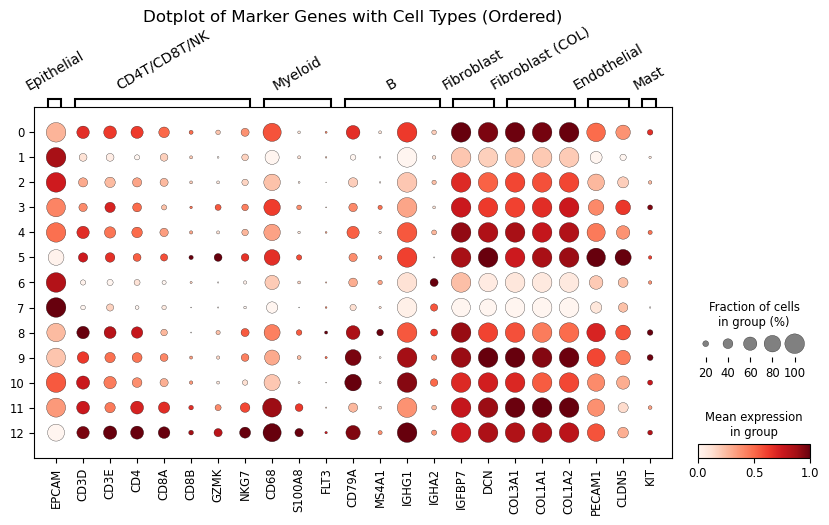

In [1184]:
import scanpy as sc

# 유전자 그룹 정의
gene_groups = {
    "Epithelial": ["EPCAM"],
    "CD4T/CD8T/NK": ["CD3D", "CD3E", "CD4", "CD8A", "CD8B", "GZMK", "NKG7"],
    "Myeloid": ["CD68", "S100A8", "FLT3"],
    "B": ["CD79A", "MS4A1", "IGHG1", "IGHA2"],
    "Fibroblast": ["IGFBP7", "DCN"],
    "Fibroblast (COL)" : ['COL3A1', 'COL1A1', 'COL1A2'],
    "Endothelial": ["PECAM1", "CLDN5"],
    "Mast": ["KIT"]
}

# 유전자 그룹 이름과 함께 유효한 유전자 리스트 생성
labeled_marker_genes = []
valid_genes = []
gene_positions = []
start = 0

for group_name, genes in gene_groups.items():
    group_valid_genes = [gene for gene in genes if gene in adata.var_names]
    if group_valid_genes:
        valid_genes.extend(group_valid_genes)
        labeled_marker_genes.extend([f"{group_name}: {gene}" for gene in group_valid_genes])
        gene_positions.append((start, start + len(group_valid_genes) - 1))
        start += len(group_valid_genes)

# dotplot 생성
sc.pl.dotplot(
    adata,
    valid_genes,  # 유효한 유전자만 전달
    groupby="clusters",  # 클러스터 정보를 포함하는 obs 컬럼
    standard_scale="var",  # 발현 값을 각 유전자별로 정규화
    var_group_positions=gene_positions,  # 그룹별 시작과 끝 위치
    var_group_labels=list(gene_groups.keys()),  # 그룹 이름 표시
    var_group_rotation=30,  # 그룹 이름 회전 각도
    title="Dotplot of Marker Genes with Cell Types (Ordered)"
)


In [1194]:
# 클러스터와 세포 유형 매핑 정의
cluster_to_cell_type = {
    '0': "Fibroblast - 1",
    '1': "None",
    '2': "Fibroblast - 4",
    '3': "Fibroblast - 4",
    '4': "Fibroblast - 4",
    '5': "Fibroblast - 3",
    '6': "None",
    '7': "None",
    '8': "Fibroblast - 4",
    '9': "Fibroblast - 2",
    '10': "Fibroblast - 4",
    '11': "Fibroblast - 2",
    '12': "Fibroblast - 3",
}

# 클러스터 번호에 따라 'Cell type' 열 추가
adata.obs['Cell type'] = adata.obs['clusters'].map(cluster_to_cell_type)

# 결과 확인
print(adata.obs[['clusters', 'Cell type']].head())


  clusters       Cell type
0        0  Fibroblast - 1
1        1            None
2        2  Fibroblast - 4
3        3  Fibroblast - 4
4        0  Fibroblast - 1


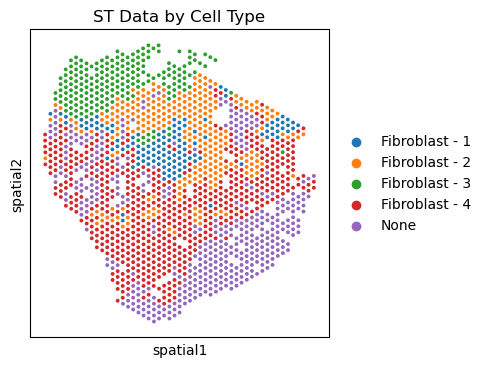

In [1195]:
import scanpy as sc

# Cell type을 기준으로 spatial plot 생성
sc.pl.spatial(
    adata,
    color="Cell type",  # 색상을 'Cell type' 열로 설정
    size=1,           # 점 크기 조절
    title="ST Data by Cell Type", # 데이터 위에 범례 표시
    img_key=None
)

In [1196]:
import pandas as pd
import numpy as np
import sys
from anndata import AnnData
import scanpy as sc
import warnings
from matplotlib import pyplot as plt
import seaborn as sns

# sys.path.append('../../spatialcorr')

import spatialcorr

warnings.simplefilter(action='ignore', category=FutureWarning)

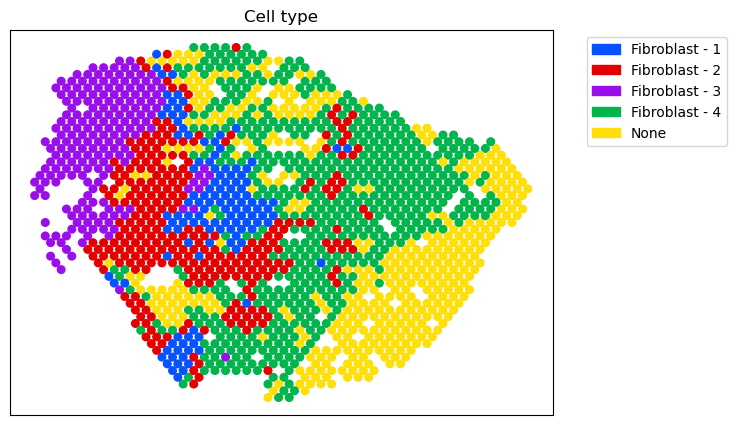

In [1197]:
spatialcorr.plot_slide(
    adata.obs, 
    adata.obs['Cell type'], 
    cmap='categorical', 
    colorbar=True,
    title="Cell type",
    ticks=False,
    dsize= 30,
    row_key="array_row",  # y 좌표에 해당하는 컬럼
    col_key="array_col"
)

In [1198]:
KERATINOCYTE_DIFF_GENES = [
'CTLA4','LCN2'
]

Kept 1386/1597 spots.


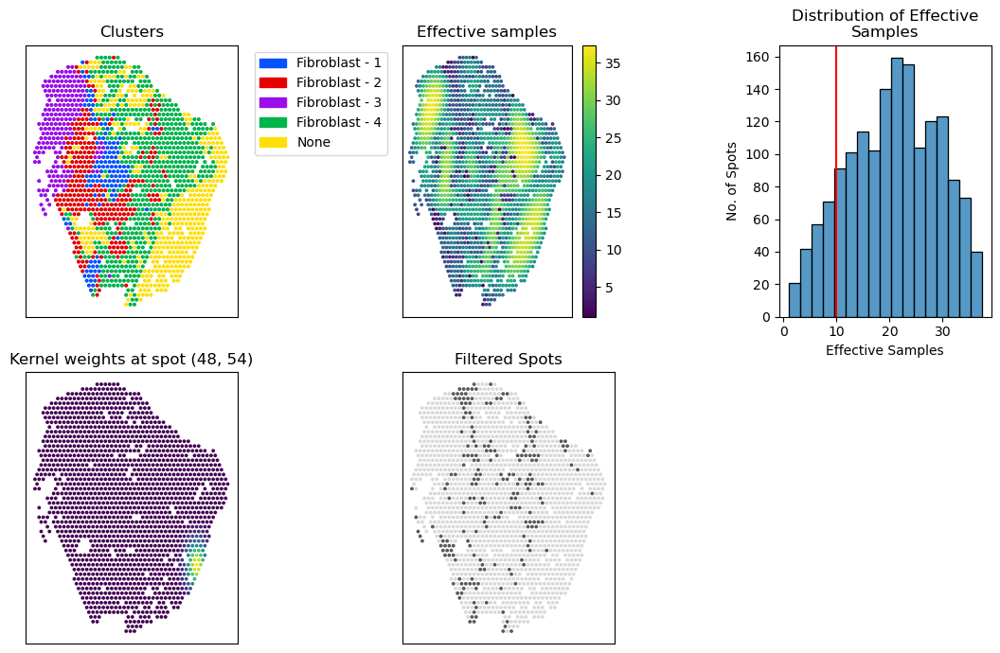

In [1199]:
spatialcorr.wrappers.kernel_diagnostics(
    adata,
    'Cell type',
    bandwidth=5,
    contrib_thresh=10,
    dsize=3,
    fpath='kernel_diagnostic.png',
    fformat='png',
    dpi=150,
    row_key="array_row",  # y 좌표에 해당하는 컬럼
    col_key="array_col"
)

Index(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9',
       ...
       '1587', '1588', '1589', '1590', '1591', '1592', '1593', '1594', '1595',
       '1596'],
      dtype='object', length=1597)


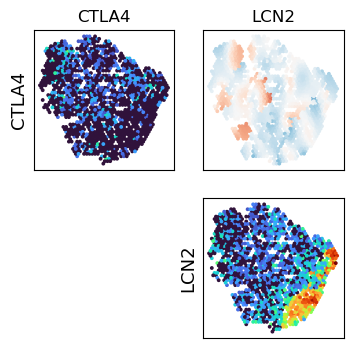

In [1200]:
# 'obs' 인덱스가 어떤 형식인지 확인
print(adata.obs.index)

# 인덱스를 문자열로 변환
adata.obs.index = adata.obs.index.astype(str)

# 다시 시도
spatialcorr.plot.mult_genes_plot_correlation(
    adata,
    KERATINOCYTE_DIFF_GENES,
    'Cell type',
    estimate='local',
    dsize=3,
    row_key="array_row",  # y 좌표에 해당하는 컬럼
    col_key="array_col"
)


Kept 1386/1597 spots.


/home/user/anaconda3/envs/kykim/lib/python3.12/site-packages/spatialcorr/statistical_test.py:1518: RuntimeWarning: invalid value encountered in scalar divide
  corr_boot = cov_boot / np.sqrt(var_1_boot * var_2_boot)


KeyError: "None of [Index(['row', 'col'], dtype='object')] are in the [columns]"

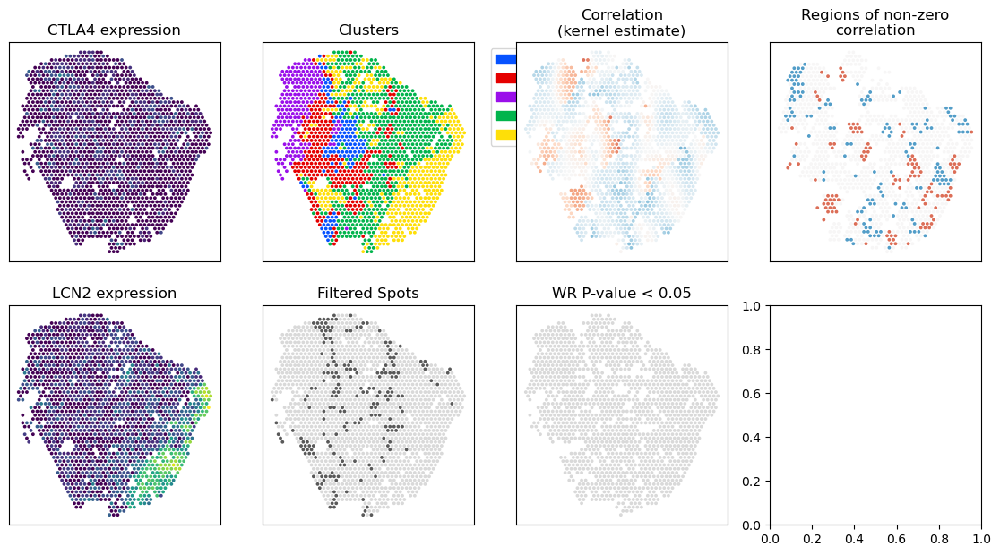

In [1201]:
spatialcorr.analysis_pipeline_pair(
    adata,              # The dataset
    'CTLA4',            # Gene 1
    'LCN2',            # Gene 2
    cond_key='Cell type', # The key in `adata.obs` storing the cluster info
    bandwidth=5,        # Kernel bandwidth
    max_perms=100,      # Maximum number of permutations to run
    dsize=3,           # Control the size of the dots
    verbose=0,          # Don't output any debuggin information
    row_key="array_row",  # y 좌표에 해당하는 컬럼
    col_key="array_col"
)

TypeError: 'Axes' object is not subscriptable

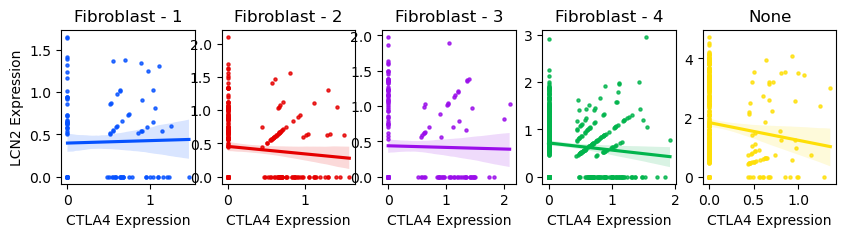

In [1202]:
spatialcorr.plot.region_scatterplots(
    adata,
    'CTLA4',
    'LCN2',
    'Cell type',
    row_key='array_row',
    col_key='array_col'
)

Correlation between CTLA4 and LCN2 average expression: -0.9845570834536064


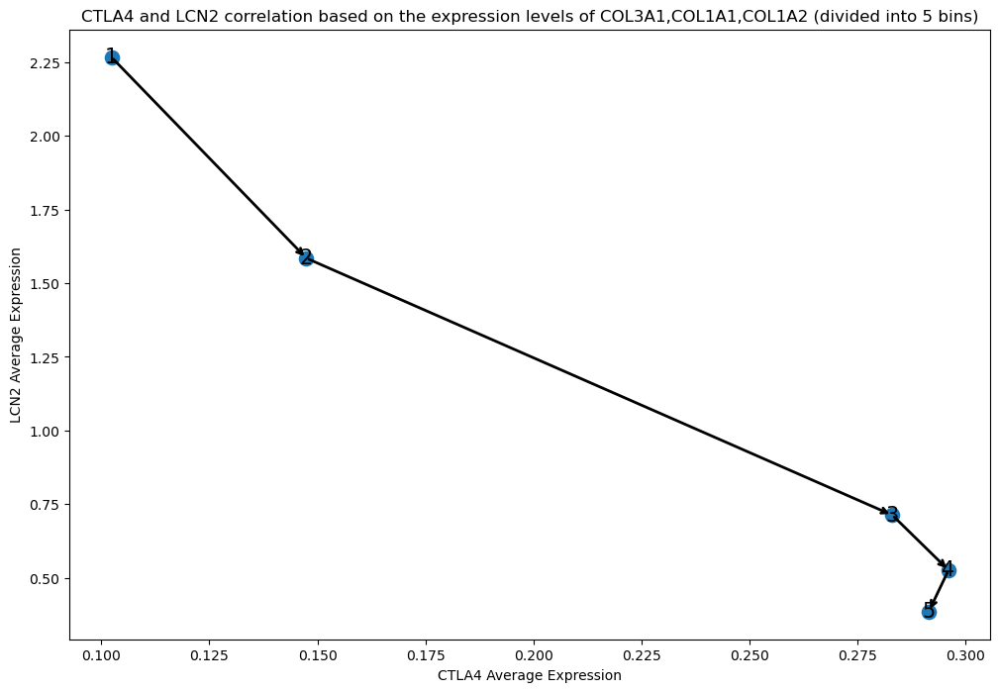

In [1203]:
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 유전자 목록
genes = ['COL3A1', 'COL1A1', 'COL1A2']

# adata.raw가 없을 경우 adata.X에서 직접 발현 값을 추출
if adata.raw is not None:
    expression_values = adata.raw[:, genes].X  # raw가 있는 경우
else:
    expression_values = adata[:, genes].X  # raw가 없는 경우 adata.X 사용

# 세 유전자 발현 점수 평균 계산
mean_expression = np.mean(expression_values.toarray(), axis=1)  # sparse matrix를 dense 형식으로 변환 후 평균 계산

# 새로운 변수로 adata.obs에 평균 발현 점수 추가
adata.obs['mean_expression'] = mean_expression

# 발현 점수를 5개의 고정된 범위로 나누기
n_bins = 5
min_value = np.min(mean_expression)
max_value = np.max(mean_expression)
bin_edges = np.linspace(min_value, max_value, n_bins + 1)  # 고정된 구간으로 나누기

# 각 발현 점수를 해당 구간에 할당
binned_expression = np.digitize(mean_expression, bin_edges)

# 각 bin에 대해 CTLA4와 LCN2 발현의 평균 계산
ctla4_expression = adata[:, 'CTLA4'].X.toarray().flatten()  # sparse matrix를 dense 형식으로 변환
lcn2_expression = adata[:, 'LCN2'].X.toarray().flatten()  # sparse matrix를 dense 형식으로 변환

# 각 bin별로 CTLA4와 LCN2 발현의 평균 계산
bin_ctla4_lcn2_avg = []
for bin_id in range(1, n_bins + 1):
    mask = binned_expression == bin_id
    # 해당 bin에 포함된 spot 개수로 나누어 평균 계산
    ctla4_avg = np.mean(ctla4_expression[mask]) if np.any(mask) else 0
    lcn2_avg = np.mean(lcn2_expression[mask]) if np.any(mask) else 0
    bin_ctla4_lcn2_avg.append((ctla4_avg, lcn2_avg))

# bin별 CTLA4와 LCN2 발현 평균의 상관 관계 계산
bin_ctla4_lcn2_avg = np.array(bin_ctla4_lcn2_avg)
correlation = np.corrcoef(bin_ctla4_lcn2_avg[:, 0], bin_ctla4_lcn2_avg[:, 1])[0, 1]

# 결과 출력
print(f'Correlation between CTLA4 and LCN2 average expression: {correlation}')

# 결과를 산점도로 시각화
plt.figure(figsize=(12, 8))
sns.scatterplot(x=bin_ctla4_lcn2_avg[:, 0], y=bin_ctla4_lcn2_avg[:, 1], s=150)  # s=150으로 점 크기 키움

# 각 dot에 화살표로 순위를 표시
for i, (ctla4_avg, lcn2_avg) in enumerate(bin_ctla4_lcn2_avg):
    # 현재 점에서 화살표를 그려서 다음 점을 가리킴
    if i < n_bins - 1:
        plt.annotate('', xy=(bin_ctla4_lcn2_avg[i + 1, 0], bin_ctla4_lcn2_avg[i + 1, 1]), 
                     xytext=(ctla4_avg, lcn2_avg),
                     arrowprops=dict(facecolor='black', edgecolor='black', arrowstyle='->', lw=2))

# 결과에 각 rank를 텍스트로 표시
for i, (ctla4_avg, lcn2_avg) in enumerate(bin_ctla4_lcn2_avg):
    plt.text(ctla4_avg, lcn2_avg, str(i + 1), fontsize=15, ha='center', va='center')  # 텍스트 크기 15로 키움

plt.xlabel('CTLA4 Average Expression')
plt.ylabel('LCN2 Average Expression')
plt.title(f'CTLA4 and LCN2 correlation based on the expression levels of COL3A1,COL1A1,COL1A2 (divided into 5 bins)')
plt.show()


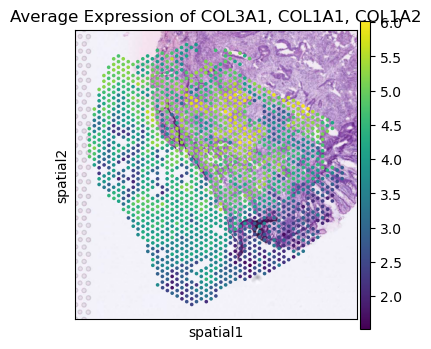

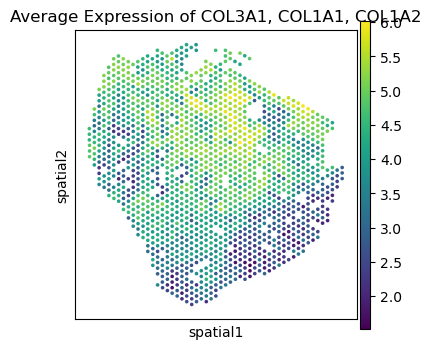

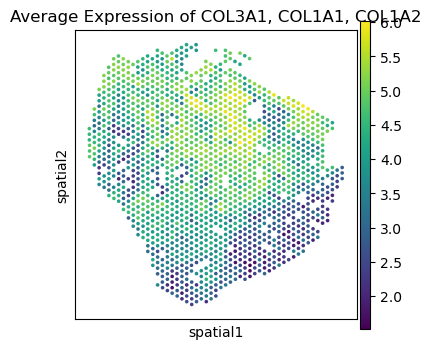

In [1214]:
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt

# 유전자 목록
genes = ['COL3A1', 'COL1A1', 'COL1A2']

# adata.raw가 없을 경우 adata.X에서 직접 발현 값을 추출
if adata.raw is not None:
    expression_values = adata.raw[:, genes].X  # raw가 있는 경우
else:
    expression_values = adata[:, genes].X  # raw가 없는 경우 adata.X 사용

# 세 유전자 발현 점수 평균 계산
mean_expression = np.mean(expression_values, axis=1)  # 세 유전자 발현 값의 평균

# 새로운 변수로 adata.obs에 평균 발현 점수 추가
adata.obs['mean_expression'] = mean_expression

# 이미지를 출력하지 않도록 img_key를 설정하지 않음
sc.pl.spatial(adata, color='mean_expression', title='Average Expression of COL3A1, COL1A1, COL1A2', img_key=None)
